# Maud CNO Analysis

In [2]:
# Imports

import os
import pickle
import gc

import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.cm as cm
import pandas as pd
import numpy as np
import seaborn as sns

from matplotlib import cm
from matplotlib.colors import Normalize
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.backends.backend_pdf import PdfPages
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import wilcoxon
from scipy.stats import pearsonr
from processing_session_trajectory import *


In [3]:
path_to_data_folder = '/home/david/MyLocalData/Maud/' # Maud work computer
# path_to_data_folder = 'C:/Users/mauds/Documents' # Maud personal computer
pattern_of_MOU_Folders = os.path.join(path_to_data_folder, "MOU*")

mice_list: list[str] = ["MOU3867","MOU4551","MOU4562","MOU4560","MOU4623","MOU4624","MOU4552","MOU4563","MOU4561","MOU4692","MOU4695","MOU4698","MOU4703","MOU4175","MOU4988","MOU4993","MOU4964","MOU4965","MOU4986","MOU5007"]
UL_Gq_D1_DLS: list[str] = ["MOU4551","MOU4988"]
UL_Gq_D2_DLS: list[str] = ["MOU4562","MOU4560","MOU4993"]
UL_Gq_D1_DMS: list[str] = ["MOU4624","MOU4552","MOU4703","MOU3867","MOU4986","MOU5007","MOU4623"]
UL_Gq_D2_DMS: list[str] = ["MOU4563","MOU4561","MOU4695","MOU4698","MOU4692","MOU4964","MOU4965","MOU4175"]
# UL_control: list[str] = ['MOU4993','MOU4987']
# UL_Gq_D1_dS: list[str] = ["MOU4183","MOU4185","MOU5008","MOU4185"]
# UL_Gq_D2_dS: list[str] = ["MOU4172","MOU4175","MOU4696","MOU4694"]
# MOU4704 : pas de fluo, ctrl ?
# To recheck and picture : MOU4562, MOU4560, MOU4552, MOU4563, MOU4561

session_list = {}
for mouse in mice_list:
    mouse_folder = os.path.join(path_to_data_folder,mouse)
    session_list[mouse] = sorted([name for name in os.listdir(mouse_folder)
                           if os.path.isdir(os.path.join(mouse_folder, name))
                           and name.startswith('MOU')])
    nb_sessions = len(session_list[mouse])
    print(f'Hello, I\'m {mouse}! I have foraged for {nb_sessions} sessions')
    # print(session_list[mouse], '\n')

Hello, I'm MOU3867! I have foraged for 59 sessions
Hello, I'm MOU4551! I have foraged for 46 sessions
Hello, I'm MOU4562! I have foraged for 46 sessions
Hello, I'm MOU4560! I have foraged for 46 sessions
Hello, I'm MOU4623! I have foraged for 46 sessions
Hello, I'm MOU4624! I have foraged for 46 sessions
Hello, I'm MOU4552! I have foraged for 46 sessions
Hello, I'm MOU4563! I have foraged for 46 sessions
Hello, I'm MOU4561! I have foraged for 46 sessions
Hello, I'm MOU4692! I have foraged for 46 sessions
Hello, I'm MOU4695! I have foraged for 46 sessions
Hello, I'm MOU4698! I have foraged for 46 sessions
Hello, I'm MOU4703! I have foraged for 47 sessions
Hello, I'm MOU4175! I have foraged for 62 sessions
Hello, I'm MOU4988! I have foraged for 45 sessions
Hello, I'm MOU4993! I have foraged for 45 sessions
Hello, I'm MOU4964! I have foraged for 45 sessions
Hello, I'm MOU4965! I have foraged for 45 sessions
Hello, I'm MOU4986! I have foraged for 45 sessions
Hello, I'm MOU5007! I have fora

In [4]:
folder_path_mouse_to_process=os.path.join(path_to_data_folder,mice_list[0])
print(folder_path_mouse_to_process)

session_control_first=session_list[mice_list[0]][28]
print(session_control_first)

session_CNO_first=session_list[mice_list[0]][31]
print(session_CNO_first)

session_control_second = session_list[mice_list[0]][33]
print(session_control_second)

session_CNO_second = session_list[mice_list[0]][36]
print(session_CNO_second)

# session_control_third = session_list[mice_list[0]][41]
# print(session_control_third)

# session_CNO_third = session_list[mice_list[0]][44]
# print(session_CNO_third)


/home/david/MyLocalData/Maud/MOU3867
MOU3867_20230206-1718
MOU3867_20230208-1202
MOU3867_20230209-1119
MOU3867_20230210-1603


In [5]:
# Définir des dictionnaires pour stocker les résultats par session et par souris
positions_cm_dict = {}
X_positions_dict = {}
Y_positions_dict = {}
total_distances = {}
average_speeds = {}
distances_dict = {}
speeds_dict = {}
angular_speeds_dict = {}
all_epochs_dict = {}
traject_time_dict = {}
run_around_tower_results_dict = {}
runs_around_tower_dict = {}
trapezes_coordinates_dict = {}
towers_coordinates_dict = {}
runs_between_towers_dict = {}
exploratory_runs_dict = {}
time_border_dict = {}
time_interior_dict = {}
time_trapeze_dict = {}
distance_border_dict = {}
distance_interior_dict = {}
distance_trapeze_dict = {}
ratio_time_trapeze_over_border = {}
ratio_distance_trapeze_over_border = {}
time_trapeze_minus_border = {}
distance_trapeze_minus_border = {}


# Boucle pour traiter chaque souris
for mouse in mice_list:
    
    # Initialiser les sous-dictionnaires pour chaque souris
    positions_cm_dict[mouse] = {}
    X_positions_dict[mouse] = {}
    Y_positions_dict[mouse] = {}
    total_distances[mouse] = {}
    average_speeds[mouse] = {}
    distances_dict[mouse] = {}
    speeds_dict[mouse] = {}
    angular_speeds_dict[mouse] = {}
    all_epochs_dict[mouse] = {}
    traject_time_dict[mouse] = {}
    run_around_tower_results_dict[mouse] = {}
    runs_around_tower_dict[mouse] = {}
    trapezes_coordinates_dict[mouse] = {}
    towers_coordinates_dict[mouse] = {}
    runs_between_towers_dict[mouse] = {}
    exploratory_runs_dict[mouse] = {}
    time_border_dict[mouse] = {}
    time_interior_dict[mouse] = {}
    time_trapeze_dict[mouse] = {}
    distance_border_dict[mouse] = {}
    distance_interior_dict[mouse] = {}
    distance_trapeze_dict[mouse] = {}
    ratio_time_trapeze_over_border[mouse] = {}
    ratio_distance_trapeze_over_border[mouse] = {}
    time_trapeze_minus_border[mouse] = {}
    distance_trapeze_minus_border[mouse] = {}

    for session_index, session_name in enumerate(session_list[mouse]):
        
        output_pickle_filepath = os.path.join(path_to_data_folder, mouse, session_name, f"{session_name}_basic_processing_output.pickle")

        if not os.path.exists(output_pickle_filepath):
            print(f"Erreur : le fichier {output_pickle_filepath} n'existe pas.")
            continue
        elif os.path.getsize(output_pickle_filepath) == 0:
            print(f"Erreur : le fichier {output_pickle_filepath} est vide.")
            continue

        # Chargement des données depuis le pickle
        try:
            with open(output_pickle_filepath, 'rb') as f:
                data = pickle.load(f)
        except EOFError:
            print(f"Erreur de lecture : le fichier {output_pickle_filepath} semble être corrompu.")
            continue

        # Extraction des données
        positions_cm = data['positions']
        X_positions_cm = data['positions'][0]
        Y_positions_cm = data['positions'][1]
        average_speed = data['average_speed']
        distances = data['distances']
        speeds = data['speeds']
        angular_speeds = data['angular_speeds']
        all_epochs = data['all_epochs']
        traject_time = data['timeofframes']
        run_around_tower_results = data['run_around_tower_sessionresult']
        runs_around_tower = all_epochs['run_around_tower']
        runs_between_towers = all_epochs['run_between_towers']
        exploratory_runs = all_epochs['exploratory_run']
        trapezes_coordinates = data['all_trapezes_coordinates_cm']
        towers_coordinates = data['towers_coordinates_cm']
        time_border = data['time_in_zones']['border']
        time_interior = data['time_in_zones']['interior']
        time_trapeze = data['time_in_zones']['trapeze']
        distance_border = data['distance_in_zones']['border']
        distance_interior = data['distance_in_zones']['interior']
        distance_trapeze = data['distance_in_zones']['trapeze']

        # Calcul de la distance totale en mètres
        total_distance = np.sum(distances) / 100

        # Stockage dans les dictionnaires complets en utilisant l'index de session
        positions_cm_dict[mouse][session_index] = positions_cm
        X_positions_dict[mouse][session_index] = X_positions_cm
        Y_positions_dict[mouse][session_index] = Y_positions_cm
        total_distances[mouse][session_index] = total_distance
        average_speeds[mouse][session_index] = average_speed
        distances_dict[mouse][session_index] = distances
        speeds_dict[mouse][session_index] = speeds
        angular_speeds_dict[mouse][session_index] = angular_speeds
        all_epochs_dict[mouse][session_index] = all_epochs
        traject_time_dict[mouse][session_index] = traject_time
        run_around_tower_results_dict[mouse][session_index] = run_around_tower_results
        runs_around_tower_dict[mouse][session_index] = runs_around_tower
        trapezes_coordinates_dict[mouse][session_index] = trapezes_coordinates
        towers_coordinates_dict[mouse][session_index] = towers_coordinates
        runs_between_towers_dict[mouse][session_index] = runs_between_towers
        exploratory_runs_dict[mouse][session_index] = exploratory_runs
        time_border_dict[mouse][session_index] = time_border
        time_interior_dict[mouse][session_index] = time_interior
        time_trapeze_dict[mouse][session_index] = time_trapeze
        distance_border_dict[mouse][session_index] = distance_border
        distance_interior_dict[mouse][session_index] = distance_interior
        distance_trapeze_dict[mouse][session_index] = distance_trapeze

        ratio_time_trapeze_over_border[mouse][session_index] = time_trapeze/time_border
        ratio_distance_trapeze_over_border[mouse][session_index] = distance_trapeze/distance_border
        time_trapeze_minus_border[mouse][session_index] = time_trapeze - time_border
        distance_trapeze_minus_border[mouse][session_index] = distance_trapeze - distance_border


# print(time_zones_dict['MOU3867'][25]['border'])

Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230203-1422/MOU3867_20230203-1422_basic_processing_output.pickle n'existe pas.


/tmp/ipykernel_8624/2673176556.py:130: RuntimeWarning: divide by zero encountered in double_scalars
  ratio_time_trapeze_over_border[mouse][session_index] = time_trapeze/time_border
/tmp/ipykernel_8624/2673176556.py:131: RuntimeWarning: divide by zero encountered in double_scalars
  ratio_distance_trapeze_over_border[mouse][session_index] = distance_trapeze/distance_border


Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230220-1225/MOU3867_20230220-1225_basic_processing_output.pickle n'existe pas.
Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230220-1736/MOU3867_20230220-1736_basic_processing_output.pickle n'existe pas.
Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230221-1038/MOU3867_20230221-1038_basic_processing_output.pickle n'existe pas.
Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230221-1708/MOU3867_20230221-1708_basic_processing_output.pickle n'existe pas.
Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230222-1147/MOU3867_20230222-1147_basic_processing_output.pickle n'existe pas.
Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230222-1705/MOU3867_20230222-1705_basic_processing_output.pickle n'existe pas.
Erreur : le fichier /home/david/MyLocalData/Maud/MOU3867/MOU3867_20230223-1049/MOU3867_20230223-1049_basic_processing_output

In [ ]:
# Définir les groupes et sessions control/CNO

groups = {
    "D1 DLS": UL_Gq_D1_DLS,
    "D2 DLS": UL_Gq_D2_DLS,
    "D1 DMS": UL_Gq_D1_DMS,
    "D2 DMS": UL_Gq_D2_DMS,
    # "D1 dS": UL_Gq_D1_dS,
    # "D2 dS": UL_Gq_D2_dS
}

# Définir les indices de sessions
session_indices = {
    "control_first": 16,
    "CNO_first": 20,
    "control_second": 26,
    "CNO_second": 30,
    "control_third": 40,
    "CNO_third": 42
}

# Paire de sessions à analyser
session_pairs = [
    ("control_first", "CNO_first"),
    ("control_second", "CNO_second"),
    ("control_third","CNO_third")
]

groups_D1_D2 = {
    "D1":UL_Gq_D1_DLS+UL_Gq_D1_DMS,
    "D2":UL_Gq_D2_DLS+UL_Gq_D2_DMS,
    "All":mice_list
}

colormaps = {
    "D1 DLS": "Greens",
    "D2 DLS": "Oranges",
    "D1 DMS": "Blues",
    "D2 DMS": "RdPu"
}

# print(groups_D1_D2['All'])

In [7]:
def plot_trajectory_3d(ax, mouse, session_index, X_positions_dict, Y_positions_dict, traject_time_dict, show_axes=True):
    """
    Plots a 3D trajectory of a mouse for a given session, with time as the color gradient.
    
    Parameters:
        mouse (str): The mouse ID.
        session_index (int): The index of the session to plot.
        X_positions_dict (dict): Dictionary of X positions for each mouse and session.
        Y_positions_dict (dict): Dictionary of Y positions for each mouse and session.
        traject_time_dict (dict): Dictionary of time points for each mouse and session.
    """
    # Extraire les données pour la souris et la session
    X_positions = X_positions_dict.get(mouse, {}).get(session_index, None)
    Y_positions = Y_positions_dict.get(mouse, {}).get(session_index, None)
    time_points = traject_time_dict.get(mouse, {}).get(session_index, None)
    
    if X_positions is None or Y_positions is None or time_points is None:
        print(f"Les données sont manquantes pour la souris {mouse} à la session {session_index}.")
        return

    # Vérifier que les dimensions sont cohérentes
    if not (len(X_positions) == len(Y_positions) == len(time_points)):
        print(f"Les dimensions des données ne correspondent pas pour la souris {mouse}, session {session_index}.")
        return

    # Limiter les trajectoires à 720 secondes
    valid_indices = [i for i, t in enumerate(time_points) if t <= 720]
    if not valid_indices:
        print(f"Pas de données valides (<= 720 s) pour la souris {mouse} à la session {session_index}.")
        return

    X_positions = [X_positions[i] for i in valid_indices]
    Y_positions = [Y_positions[i] for i in valid_indices]
    time_points = [time_points[i] for i in valid_indices]

    # # Normaliser les temps pour le gradient de couleur
    # norm = Normalize(vmin=min(time_points)+50, vmax=max(time_points)+50)
    # colors = cm.BuPu(norm(time_points))  # RdPu # BuPu

    # Créer une version modifiée de la colormap 'BuPu' en limitant le domaine
    cmap = cm.RdPu  # Colormap d'origine RdPu # PuRd
    # Découper la colormap pour ignorer les premières valeurs (plus claires)
    new_cmap = LinearSegmentedColormap.from_list("modified_RdPu", cmap(np.linspace(0.3, 1, 256)))

    # Normaliser les temps pour le gradient de couleur (en évitant les valeurs trop basses)
    norm = Normalize(vmin=min(time_points), vmax=max(time_points))
    colors = new_cmap(norm(time_points))  # Appliquer la colormap modifiée


    # Tracer la trajectoire avec un gradient de couleur
    for i in range(len(X_positions) - 1):
        ax.plot(
            X_positions[i:i+2],  # Segment X
            Y_positions[i:i+2], # Segment Y
            [time_points[i], time_points[i+1]],  # Segment Z
            color=colors[i],  # Couleur basée sur le temps
            linewidth=1.5
        )

    # Ajouter des labels aux axes
    if show_axes:
        ax.set_xlabel("X Position (cm)")
        ax.set_ylabel("Y positions (cm)")
        ax.set_zlabel("Time (s)")

    # Ajouter une barre de couleur
    # sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    # sm.set_array([])
    # cbar = plt.colorbar(sm, ax=ax, shrink=0.5, aspect=10)
    # cbar.set_label("Time (s)")

    # Titre
    ax.set_title(f"Session {session_index+1}")
    # ax.set_facecolor('#dddddd')
    ax.grid(False)
    ax.set_zlim(0,720)

gc.collect()

# Exemple d'appel de la fonction
# fig, axs = plt.subplots(1,4,figsize=(24,6), subplot_kw={'projection': '3d'})
# plot_trajectory_3d(axs[0], "MOU4562", 0, X_positions_dict, Y_positions_dict, traject_time_dict)
# plot_trajectory_3d(axs[1], "MOU4562", 6, X_positions_dict, Y_positions_dict, traject_time_dict, show_axes=False)
# plot_trajectory_3d(axs[2], "MOU4562", 12, X_positions_dict, Y_positions_dict, traject_time_dict, show_axes=False)
# plot_trajectory_3d(axs[3], "MOU4562", 18, X_positions_dict, Y_positions_dict, traject_time_dict, show_axes=False)

# plt.show()


0

In [8]:
def compare_sessions_by_group(ax, data_dict, groups, session_indices, session_type="first", ylabel=None, ylim=None, quartile_dict=None):
    """
    Compare les valeurs des sessions control et CNO pour chaque groupe sous forme de points reliés.
    
    Parameters:
    - ax: L'axe sur lequel le graphique sera tracé.
    - data_dict: Le dictionnaire contenant les données à comparer (e.g., total_distances).
    - groups: Dictionnaire des groupes de souris à analyser, avec le nom du groupe comme clé et la liste des souris comme valeur.
    - session_type: "first", "second" ou "third", la session à comparer (CNO et control).
    - ylabel: Label de l'axe Y pour le graphique.
    """
    # Extraire les indices de session pour le type de session spécifié
    control_session_index = session_indices.get(f"control_{session_type}")
    CNO_session_index = session_indices.get(f"CNO_{session_type}")
    
    if control_session_index is None or CNO_session_index is None:
        print(f"Erreur : indices de session manquants pour le type '{session_type}'.")
        return
    
    tick_positions = []
    session_labels = []
    group_annotations = []

    # Définir les colormaps pour chaque groupe

    colormaps = {
        "D1 DLS": "Greens",
        "D2 DLS": "Oranges",
        "D1 DMS": "Blues",
        "D2 DMS": "RdPu",
        "D1 dS":"Purples",
        "D2 dS":"OrRd"
    }

    # Déterminer les positions des sessions pour chaque groupe
    for i, (group_name, group_mice) in enumerate(groups.items()):
        group_control_data = []
        group_CNO_data = []
        
        # Extraire les données pour chaque souris du groupe
        for mouse in group_mice:
            if control_session_index in data_dict[mouse] and CNO_session_index in data_dict[mouse]:
                group_control_data.append(data_dict[mouse][control_session_index])
                group_CNO_data.append(data_dict[mouse][CNO_session_index])
            else:
                print(f"Avertissement : données manquantes pour {mouse} dans les sessions de type '{session_type}'")

        # Position des ticks pour le groupe (2 par groupe : "control" et "CNO")
        control_position = i * 2
        CNO_position = i * 2 + 1
        
        # Enregistrer les positions et labels pour chaque session
        tick_positions.extend([control_position, CNO_position])
        session_labels.extend(["control", "CNO"])
        
        # Ajouter une annotation pour le groupe centré entre control et CNO
        group_annotations.append((control_position + 0.5, group_name))  # Centre des positions control et CNO

        # Récupérer la colormap correspondante pour le groupe
        cmap = plt.get_cmap(colormaps.get(group_name))
        colors= cmap(np.linspace(0.3, 1, len(group_mice)))
        
        # Tracer les points pour chaque souris du groupe
        for j in range(len(group_control_data)):
            data = [group_control_data[j], group_CNO_data[j]]
            ax.plot([control_position, CNO_position], data, color=colors[j], linewidth=2, linestyle='-', marker='o', markersize=8)
    
    # Ajouter des titres et des labels
    ax.set_title(f'{session_type.capitalize()} session', fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=12, fontweight='bold')
    # ax.set_xlabel('Sessions', fontsize=12, fontweight='bold')

    # Définir les positions et labels des ticks sur l'axe X (pour chaque session)
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(session_labels)

    # Limiter l'axe Y pour ajouter de la marge
    all_data = [value for group_mice in groups.values() for mouse in group_mice
                for value in [data_dict[mouse].get(control_session_index), data_dict[mouse].get(CNO_session_index)]
                if value is not None]
    ax.set_xlim(-0.5, len(groups) * 2 - 0.5)
    if ylim==None:
        ax.set_ylim(0, max(all_data) * 1.2)
    else:
        ax.set_ylim(ylim)

    # Ajouter les annotations pour les groupes sous chaque paire de ticks
    for pos, group_name in group_annotations:
        ax.annotate(group_name, xy=(pos, -0.1), xycoords=('data', 'axes fraction'), ha='center', 
                    fontsize=10, fontweight='bold')
    
    # Suppression des grilles pour un look plus propre
    ax.grid(False)
    
    # Améliorer la lisibilité des axes
    ax.tick_params(axis='y', which='major', labelsize=10)
    ax.tick_params(axis='x', which='major', labelsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)


Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4993 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4993 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


/tmp/ipykernel_8624/1508617232.py:12: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


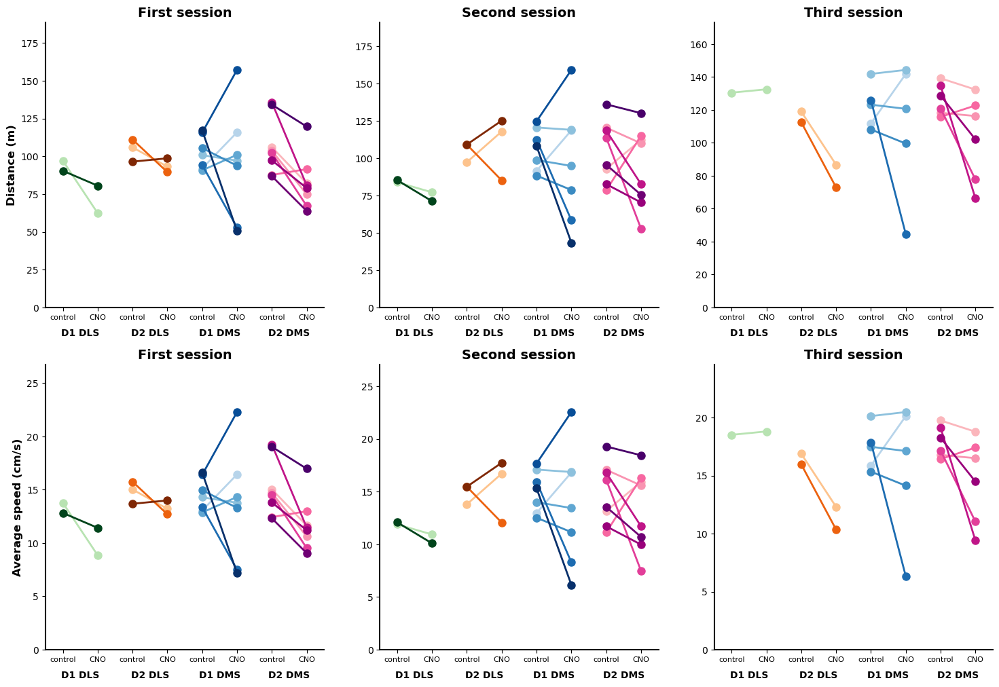

In [9]:
# Utiliser gridspec_kw pour ajuster l'espacement vertical
fig, axs = plt.subplots(2, 3, figsize=(18, 12), gridspec_kw={'hspace': 0.2})

# Comparer les sessions en appelant la fonction pour chaque paire
compare_sessions_by_group(axs[0, 0], total_distances, groups, session_indices, session_type="first", ylabel='Distance (m)')
compare_sessions_by_group(axs[0, 1], total_distances, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], total_distances, groups, session_indices, session_type="third", ylabel=None)
compare_sessions_by_group(axs[1, 0], average_speeds, groups, session_indices, session_type="first", ylabel='Average speed (cm/s)')
compare_sessions_by_group(axs[1, 1], average_speeds, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], average_speeds, groups, session_indices, session_type="third", ylabel=None)

plt.tight_layout()
plt.show()

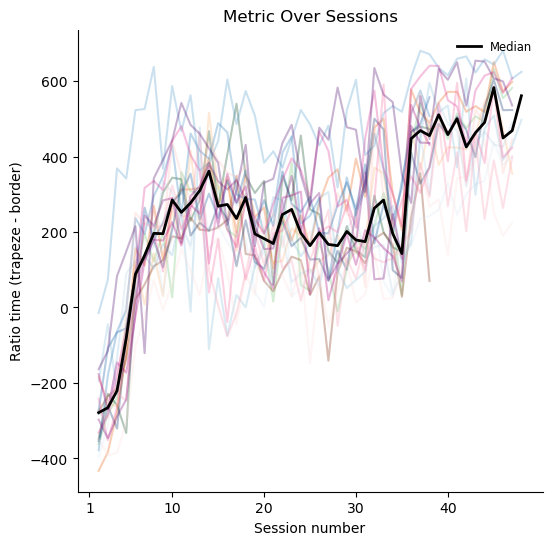

In [10]:
def plot_metric_over_sessions(ax, metric_dict, group_dict, colormaps, title="Metric Over Sessions", ylabel="Metric"):
    """
    Plots a given metric over sessions with individual data in transparency and the group median in black.
    
    Parameters:
        ax (matplotlib.axes.Axes): Axes object on which to plot.
        metric_dict (dict): Dictionary of metrics with mouse IDs as keys and session indices as nested keys.
        group_dict (dict): Dictionary mapping mouse IDs to their group (e.g., "D1 DLS").
        colormaps (dict): Dictionary mapping groups to colormap names (e.g., {"D1 DLS": "Greens"}).
        title (str): Title of the plot.
        ylabel (str): Label for the y-axis.
    """
    all_sessions_data = {}  # Collect session-wise data for median computation

    for group, animals in group_dict.items():
        # Récupérer la colormap pour chaque groupe
        cmap = cm.get_cmap(colormaps.get(group, "gray"))
        
        # Pour chaque souris dans ce groupe, on trace sa courbe avec une couleur spécifique
        for idx, mouse in enumerate(animals):
            session_data = metric_dict.get(mouse, {})
            
            # Calculer la couleur à appliquer (plus clair pour les premières souris et plus foncé pour les dernières)
            color = cmap((idx + 1) / len(animals))  # Échelle de couleur entre 0 et 1
            
            # Extraire les valeurs x et y pour chaque souris
            x_values = sorted(session_data.keys())
            y_values = [session_data[session_idx] for session_idx in x_values]

            # Mettre à jour les données pour le calcul de la médiane
            for session_idx, value in session_data.items():
                if session_idx not in all_sessions_data:
                    all_sessions_data[session_idx] = []
                all_sessions_data[session_idx].append(value)

            # Tracer les données individuelles avec la couleur spécifiée
            ax.plot([x + 1 for x in x_values], y_values, color=color, alpha=0.3, zorder=1)

    # Calculer et tracer la médiane pour toutes les souris par session
    median_x = sorted(all_sessions_data.keys())
    median_y = [np.median(all_sessions_data[idx]) for idx in median_x]
    ax.plot([x + 1 for x in median_x], median_y, color="black", lw=2, label="Median", zorder=2)

    # Définir les positions des ticks en X
    tick_positions = [0, 9, 19, 29, 39]  # Positions des ticks pour les numéros de session
    ax.set_xticks(tick_positions)
    ax.set_xticklabels([str(tick + 1) for tick in tick_positions])  # Correspondance session_index + 1

    # Personnaliser le graphique
    ax.set_title(title)
    ax.set_xlabel("Session number")
    ax.set_ylabel(ylabel)
    ax.legend(loc="upper right", fontsize="small", frameon=False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


# Exemple d'utilisation avec des données fictives
fig, ax = plt.subplots(figsize=(6,6))
plot_metric_over_sessions(ax, time_trapeze_minus_border, groups, colormaps, title="Metric Over Sessions", ylabel="Ratio time (trapeze - border)")
plt.show()

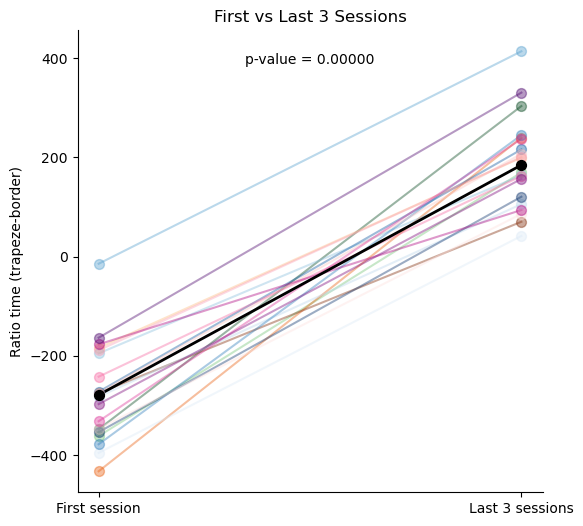

In [11]:
def plot_first_vs_last3(ax, metric_dict, group_dict, colormaps, title="First vs Last 3 Sessions", ylabel="Metric"):
    """
    Plots a comparison of a metric between the first session and the last 3 sessions (up to session 19).
    
    Parameters:
        ax (matplotlib.axes.Axes): Axes object on which to plot.
        metric_dict (dict): Dictionary of metrics with mouse IDs as keys and session indices as nested keys.
        group_dict (dict): Dictionary mapping mouse IDs to their group (e.g., "D1 DLS").
        colormaps (dict): Dictionary mapping groups to colormap names (e.g., {"D1 DLS": "Greens"}).
        title (str): Title of the plot.
        ylabel (str): Label for the y-axis.
    """
    first_sessions = []
    last_sessions = []
    
    for group, animals in group_dict.items():
        # Récupérer la colormap pour chaque groupe
        cmap = cm.get_cmap(colormaps.get(group, "gray"))
        
        # Pour chaque souris dans ce groupe, on trace sa courbe avec une couleur spécifique
        for idx, mouse in enumerate(animals):
            session_data = metric_dict.get(mouse, {})
            
            # Calculer la couleur à appliquer (plus clair pour les premières souris et plus foncé pour les dernières)
            color = cmap((idx + 1) / len(animals))  # Échelle de couleur entre 0 et 1

            # Limiter aux sessions jusqu'à l'index 19 (si l'animal a plus de sessions)
            session_data = {k: v for k, v in session_data.items() if k <= 19}
            
            if len(session_data) > 0:
                # Récupérer la première session (session 0)
                first_session = session_data.get(0, np.nan)
                
                # Récupérer les 3 dernières sessions (en prenant la plage de sessions de l'animal)
                session_indices = sorted(session_data.keys())[-3:]  # Les 3 derniers indices disponibles
                last_3_sessions = [session_data.get(i, np.nan) for i in session_indices]
                
                # Calculer la médiane des 3 dernières sessions
                last_3_session_median = np.median(last_3_sessions) if len(last_3_sessions) >= 3 else np.nan
                first_sessions.append(first_session)
                last_sessions.append(last_3_session_median)

                # Tracer les données individuelles (comparaison de la première et des 3 dernières sessions)
                ax.plot(["First session", "Last 3 sessions"], [first_session, last_3_session_median], 
                        color=color, alpha=0.4, label=f'{mouse} ({group})', zorder=1)
                ax.scatter("First session", first_session, color=color, alpha=0.4, zorder=3, s=50, label=f'{mouse} First' if idx == 0 else "")
                ax.scatter("Last 3 sessions", last_3_session_median, color=color, alpha=0.4, zorder=3, s=50, label=f'{mouse} Last' if idx == 0 else "")


    # Calculer la médiane pour la "First session" et les "Last 3 sessions"
    first_median = np.nanmedian(first_sessions)
    last_median = np.nanmedian(last_sessions)

    # Tracer les médianes
    ax.plot(["First session", "Last 3 sessions"], [first_median, last_median], color="black", lw=2, label="Median", zorder=2)
    ax.scatter(["First session", "Last 3 sessions"], [first_median, last_median], color="black", zorder=3, s=50, label=f'{mouse} Last' if idx == 0 else "")

    # Test statistique de Wilcoxon (exclure les valeurs NaN)
    valid_pairs = [(f, l) for f, l in zip(first_sessions, last_sessions) if not (np.isnan(f) or np.isnan(l))]
    if len(valid_pairs) > 0:
        first_vals, last_vals = zip(*valid_pairs)
        try:
            stat, p_value = wilcoxon(first_vals, last_vals)
        except ValueError:  # Si le test échoue (par exemple, si toutes les valeurs sont identiques)
            p_value = np.nan
    else:
        p_value = np.nan

    # Ajouter la p-value sur le graphique si significative
    if not np.isnan(p_value):
        ax.text(0.5, 0.95, f"p-value = {p_value:.5f}", transform=ax.transAxes, 
                ha="center", va="top", fontsize=10)

    # Personnaliser le graphique
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Exemple d'utilisation avec des données fictives
fig, ax = plt.subplots(figsize=(6,6))
plot_first_vs_last3(ax, time_trapeze_minus_border, groups, colormaps, title="First vs Last 3 Sessions", ylabel="Ratio time (trapeze-border)")
plt.show()

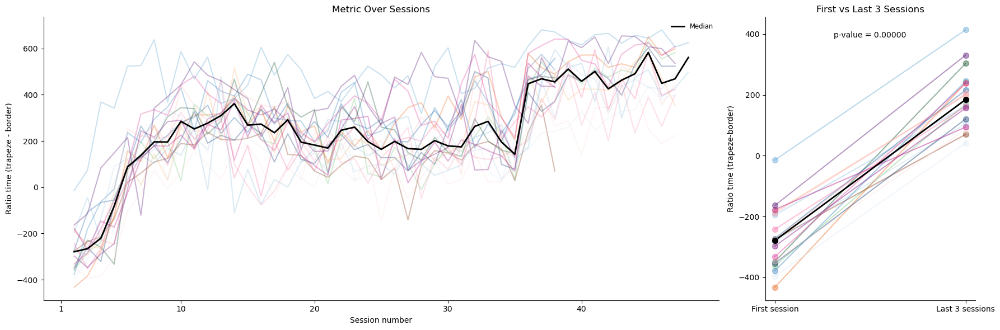

In [12]:
fig = plt.figure(figsize=(18, 6))

# Créer un Gridspec avec une ligne et 3 colonnes
gs = fig.add_gridspec(1, 3, width_ratios=[2, 1, 1])  # 2 colonnes pour le premier graphique, 1 pour le second

# Le premier graphique s'étend sur les deux premières colonnes
ax1 = fig.add_subplot(gs[0, :2])  # Étendre sur les deux premières colonnes
plot_metric_over_sessions(ax1, time_trapeze_minus_border, groups, colormaps, title="Metric Over Sessions", ylabel="Ratio time (trapeze - border)")

# Le deuxième graphique occupe la dernière colonne
ax2 = fig.add_subplot(gs[0, 2])  # Dernière colonne
plot_first_vs_last3(ax2, time_trapeze_minus_border, groups, colormaps, title="First vs Last 3 Sessions", ylabel="Ratio time (trapeze-border)")

# Affichage avec un espacement automatique
plt.tight_layout()
plt.show()

### First : comparison of parameter regarding all epochs types

### Second : QT metrics

In [13]:
# distance, time, mean speed, max speed
# Initialize counters and lists for run analysis

total_time_QT_dict = {}
total_distance_QT_dict = {}
meanspeed_QT_dict = {}
maxspeed_QT_dict = {}

for mouse in mice_list:
    total_time_QT_dict[mouse] = {}
    total_distance_QT_dict[mouse] = {}
    meanspeed_QT_dict[mouse] = {}
    maxspeed_QT_dict[mouse] = {}

    for session_index, session_name in enumerate(session_list[mouse]):

            total_time_QT = 0
            total_distance_QT = 0
            speed_QT = []

            for run in runs_around_tower_dict[mouse][session_index]:
                start_index, end_index = run[0][0], run[0][1]
                run_duration = traject_time_dict[mouse][session_index][end_index] - traject_time_dict[mouse][session_index][start_index]
                distance_ran = np.sum(distances_dict[mouse][session_index][start_index:end_index])

                # Accumulate metrics
                speed_QT.append(distance_ran / run_duration)
                total_time_QT += run_duration
                total_distance_QT += distance_ran

            # Store results for this session in the dictionaries
            meanspeed_QT_dict[mouse][session_index] = np.mean(speed_QT)
            maxspeed_QT_dict[mouse][session_index] = np.max(speed_QT)
            total_time_QT_dict[mouse][session_index] = round(total_time_QT, 2)
            total_distance_QT_dict[mouse][session_index] = round(total_distance_QT, 2)

# print(total_time_QT_dict)


KeyError: 21

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


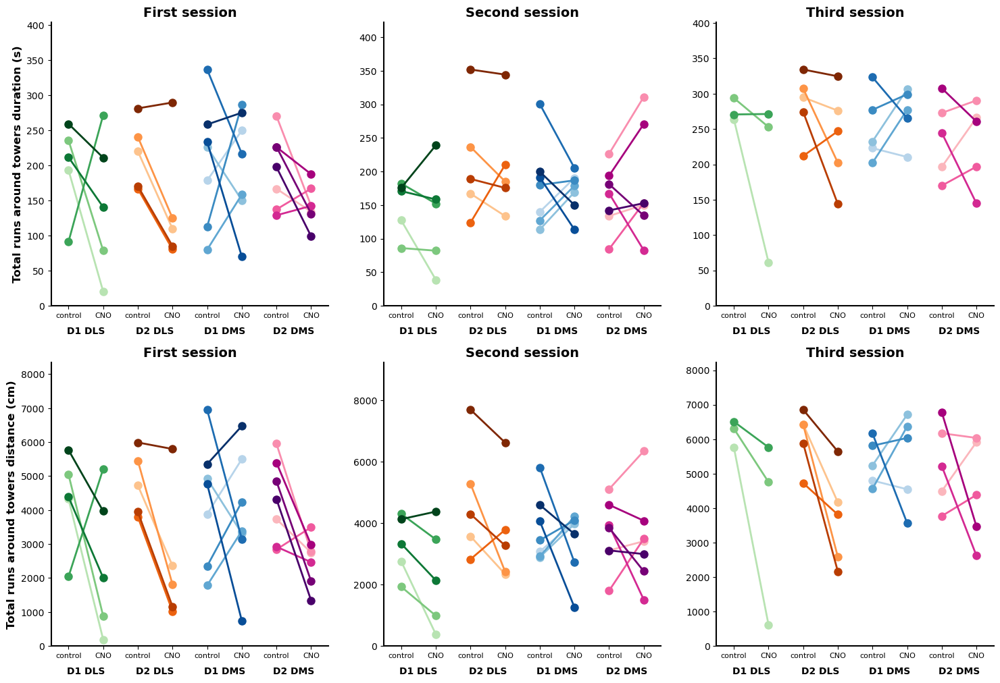

In [ ]:
# total runs around towers duration/distance

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], total_time_QT_dict, groups, session_indices, session_type="first", ylabel='Total runs around towers duration (s)')
compare_sessions_by_group(axs[0, 1], total_time_QT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], total_time_QT_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], total_distance_QT_dict, groups, session_indices, session_type="first", ylabel='Total runs around towers distance (cm)')
compare_sessions_by_group(axs[1, 1], total_distance_QT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], total_distance_QT_dict, groups, session_indices, session_type="third", ylabel=None)

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


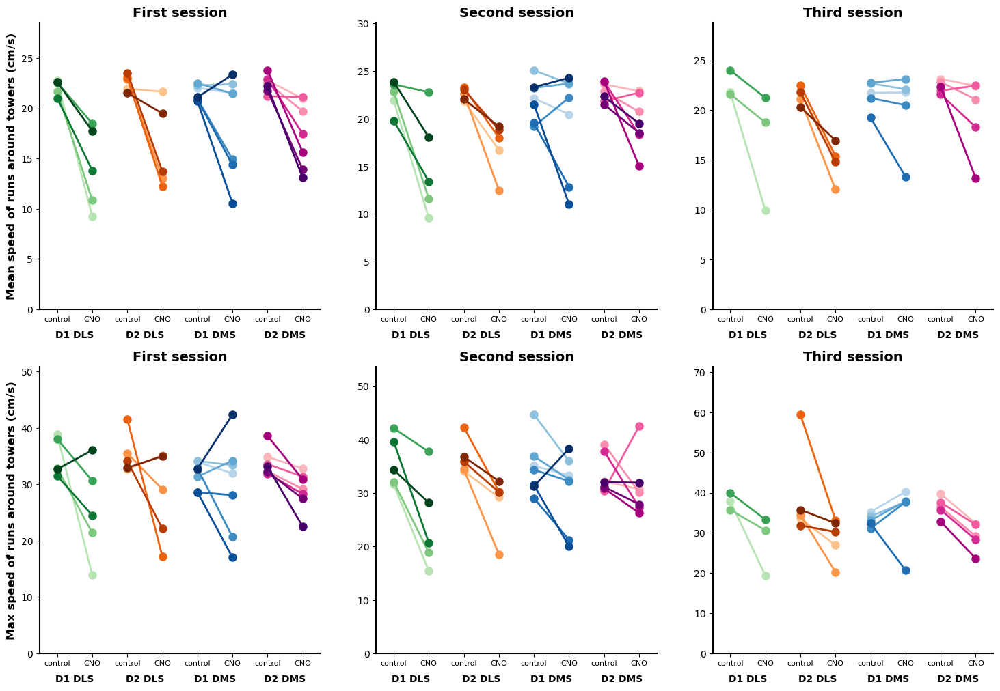

In [ ]:
# mean speed, max speed

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], meanspeed_QT_dict, groups, session_indices, session_type="first", ylabel='Mean speed of runs around towers (cm/s)')
compare_sessions_by_group(axs[0, 1], meanspeed_QT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], meanspeed_QT_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], maxspeed_QT_dict, groups, session_indices, session_type="first", ylabel='Max speed of runs around towers (cm/s)')
compare_sessions_by_group(axs[1, 1], maxspeed_QT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], maxspeed_QT_dict, groups, session_indices, session_type="third", ylabel=None)


In [ ]:
# Dictionnaries of CW/CCW/rewarded/unrewarded/total

total_QT_dict = {}
total_QT_rewarded_dict = {}
total_QT_unrewarded_dict = {}
total_CW_dict = {}
total_CCW_dict = {}
ratio_CW_CCW_dict = {}
percentage_rewarded_dict = {}

for mouse in mice_list:
    
    total_QT_dict[mouse] = {}
    total_QT_rewarded_dict[mouse] = {}
    total_QT_unrewarded_dict[mouse] = {}
    total_CW_dict[mouse] = {}
    total_CCW_dict[mouse] = {}
    ratio_CW_CCW_dict[mouse] = {}
    percentage_rewarded_dict[mouse] = {}

    for session_index, session_name in enumerate(session_list[mouse]):

        total_CW_rewarded = run_around_tower_results_dict[mouse][session_index]['All']['rewarded_CW']
        total_CCW_rewarded = run_around_tower_results_dict[mouse][session_index]['All']['rewarded_CCW']
        total_CW = run_around_tower_results_dict[mouse][session_index]['All']['total_CW']
        total_CCW = run_around_tower_results_dict[mouse][session_index]['All']['total_CCW']
        
        total_QT = total_CW + total_CCW
        total_QT_rewarded = total_CW_rewarded + total_CCW_rewarded
        total_QT_unrewarded = total_QT - total_QT_rewarded
        ratio_CW_CCW = (total_CW - total_CCW) / total_QT
        percentage_rewarded = round((total_QT_rewarded / total_QT) * 100, 2)

        total_QT_dict[mouse][session_index] = total_QT
        total_QT_rewarded_dict[mouse][session_index] = total_QT_rewarded
        total_QT_unrewarded_dict[mouse][session_index] = total_QT_unrewarded
        total_CW_dict[mouse][session_index] = total_CW
        total_CCW_dict[mouse][session_index] = total_CCW
        ratio_CW_CCW_dict[mouse][session_index] = ratio_CW_CCW
        if session_index == 0:
            percentage_rewarded_dict[mouse][session_index] = 0
        else:
            percentage_rewarded_dict[mouse][session_index] = percentage_rewarded

# print(percentage_rewarded_dict)
# print(total_CW_dict['MOU3867'][25])


Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


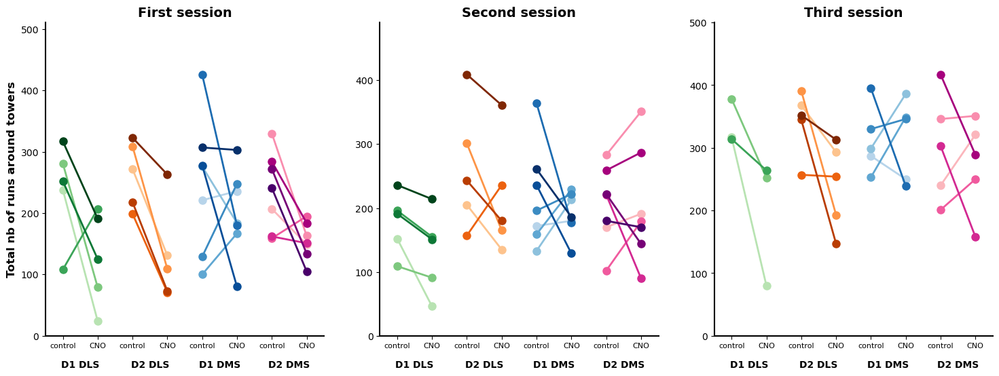

In [ ]:
# Total nb of QT

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

compare_sessions_by_group(axs[0], total_QT_dict, groups, session_indices, session_type="first", ylabel='Total nb of runs around towers')
compare_sessions_by_group(axs[1], total_QT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[2], total_QT_dict, groups, session_indices, session_type="third", ylabel=None)

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


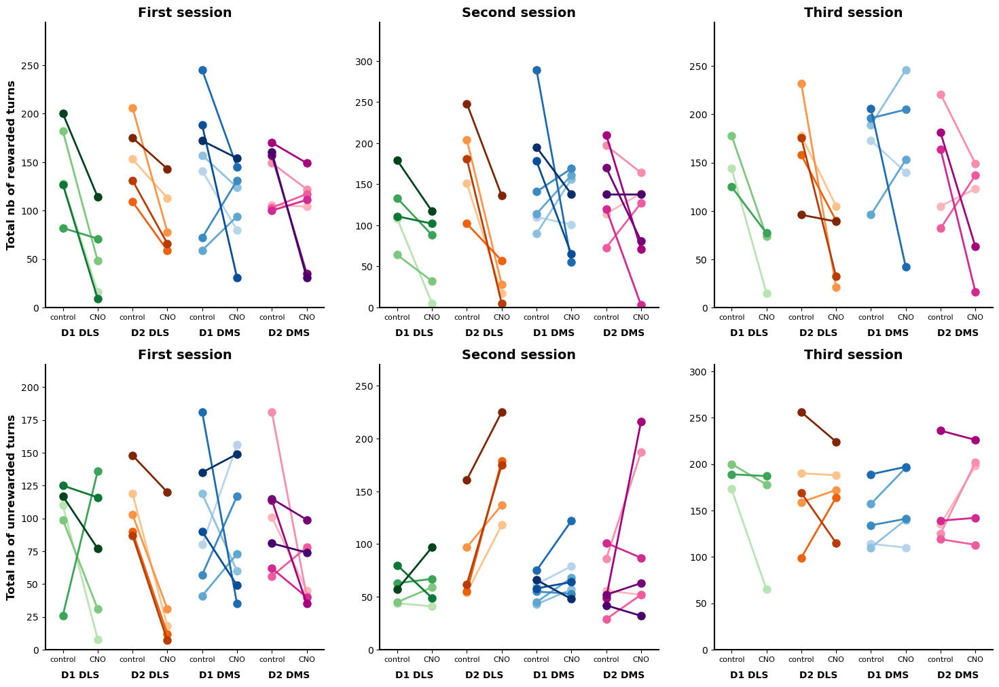

In [ ]:
# rewarded, unrewarded

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], total_QT_rewarded_dict, groups, session_indices, session_type="first", ylabel='Total nb of rewarded turns')
compare_sessions_by_group(axs[0, 1], total_QT_rewarded_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], total_QT_rewarded_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], total_QT_unrewarded_dict, groups, session_indices, session_type="first", ylabel='Total nb of unrewarded turns')
compare_sessions_by_group(axs[1, 1], total_QT_unrewarded_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], total_QT_unrewarded_dict, groups, session_indices, session_type="third", ylabel=None)


Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


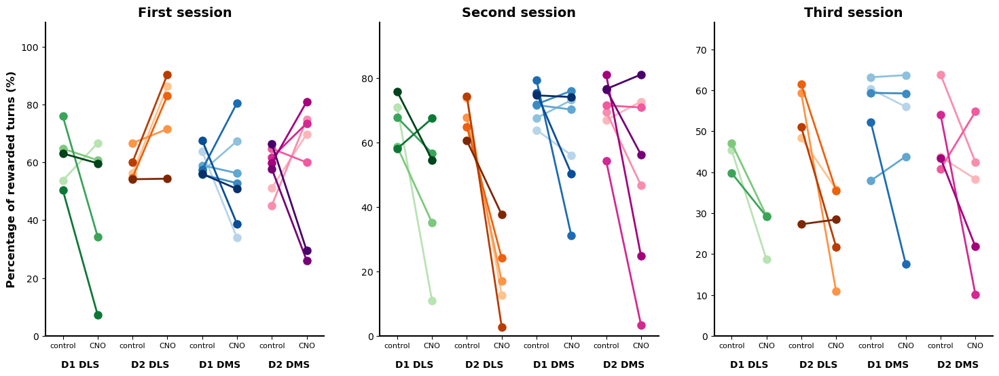

In [ ]:
# Percentage of rewarded turns

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

compare_sessions_by_group(axs[0], percentage_rewarded_dict, groups, session_indices, session_type="first", ylabel='Percentage of rewarded turns (%)')
compare_sessions_by_group(axs[1], percentage_rewarded_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[2], percentage_rewarded_dict, groups, session_indices, session_type="third", ylabel=None)


Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


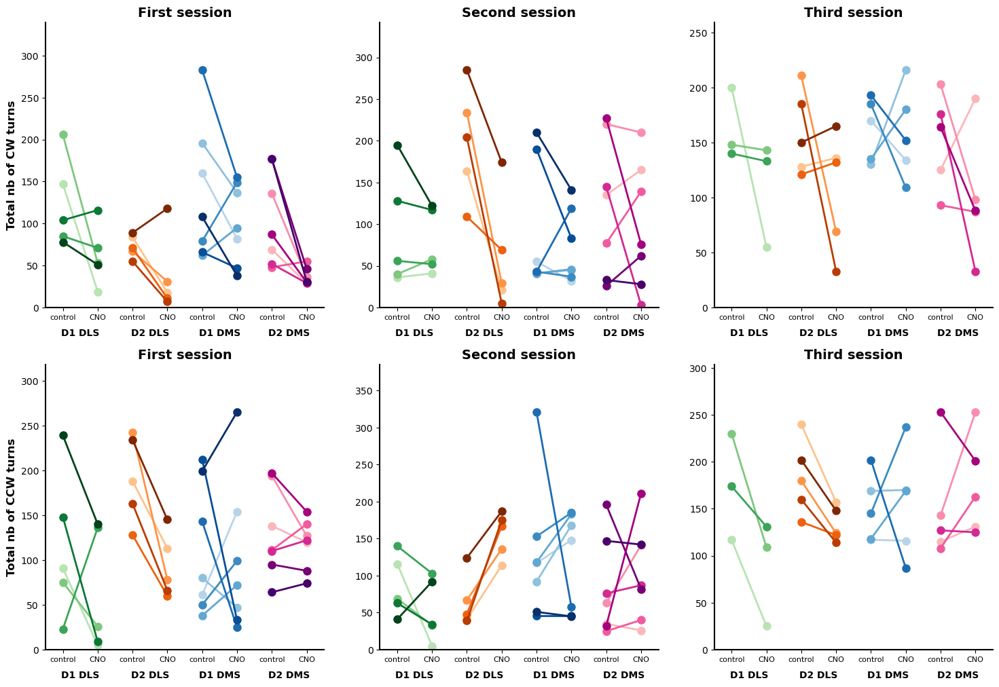

In [ ]:
# nb CW / CCW

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], total_CW_dict, groups, session_indices, session_type="first", ylabel='Total nb of CW turns')
compare_sessions_by_group(axs[0, 1], total_CW_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], total_CW_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], total_CCW_dict, groups, session_indices, session_type="first", ylabel='Total nb of CCW turns')
compare_sessions_by_group(axs[1, 1], total_CCW_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], total_CCW_dict, groups, session_indices, session_type="third", ylabel=None)

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


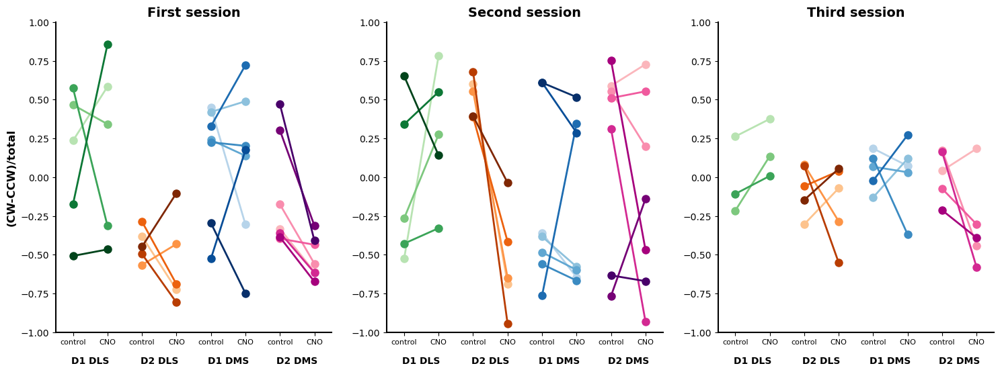

In [ ]:
# ratio CW/CCW

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

compare_sessions_by_group(axs[0], ratio_CW_CCW_dict, groups, session_indices, session_type="first", ylabel='(CW-CCW)/total', ylim=(-1,1))
compare_sessions_by_group(axs[1], ratio_CW_CCW_dict, groups, session_indices, session_type="second", ylabel=None, ylim=(-1,1))
compare_sessions_by_group(axs[2], ratio_CW_CCW_dict, groups, session_indices, session_type="third", ylabel=None, ylim=(-1,1))


### Third : BT metrics

In [ ]:
# for mouse in mice_list:
#     for session_index, session_name in enumerate(session_list[mouse]):
#         for run in runs_around_tower_dict[mouse][session_index]:
#             print(run[0])

# print(runs_around_tower_dict['MOU3867'][0][0])


In [ ]:
# Dictionnaires pour stocker les résultats des vitesses angulaires des runs between towers
angular_speeds_BT = {}
median_angular_speed_BT = {}

# Boucle pour chaque animal
for mouse in mice_list:
    # Initialisation des dictionnaires pour l'animal
    angular_speeds_BT[mouse] = {}
    median_angular_speed_BT[mouse] = {}

    # Boucle pour chaque session
    for session_index, session_name in enumerate(session_list[mouse]):
        
        # Initialisation d'une liste pour stocker toutes les vitesses angulaires pour les runs between towers de cette session
        session_angular_speeds = []
        
        # Extraction des runs between towers
        runs_between_towers = runs_between_towers_dict[mouse][session_index]
        
        # Boucle pour chaque run between towers
        for run in runs_between_towers:

            # Extraction des indices de début et de fin du run
            start_idx, end_idx = run[0]  # Indices pour extraire les données

            # Extraction des coordonnées et du temps de la trajectoire pour le run
            X_run = X_positions_dict[mouse][session_index][start_idx:end_idx]
            Y_run = Y_positions_dict[mouse][session_index][start_idx:end_idx]
            time_run = traject_time_dict[mouse][session_index][start_idx:end_idx]

            # Vérifier que les données extraites sont valides
            if len(X_run) > 1 and len(Y_run) > 1 and len(time_run) > 1:
                # Calcul des distances, vitesses et vitesses angulaires
                distances, speeds, angular_speeds = compute_distance_speed_angular_speed(
                    [X_run, Y_run], time_run
                )
                # Ajouter les vitesses angulaires des runs à la liste de la session
                session_angular_speeds.extend(angular_speeds)
            else:
                print(f"Run invalide pour la souris {mouse}, session {session_name}, indices ({start_idx}, {end_idx}).")

        # Stockage des vitesses angulaires de la session dans le dictionnaire
        angular_speeds_BT[mouse][session_index] = session_angular_speeds
        
        # Calcul de la médiane des vitesses angulaires pour cette session
        if session_angular_speeds:  # Vérifie s'il y a des vitesses angulaires pour éviter les erreurs
            median_angular_speed_BT[mouse][session_index] = np.median(session_angular_speeds)
        else:
            median_angular_speed_BT[mouse][session_index] = None  # Si aucune vitesse angulaire, médiane non calculable

# Affichage des résultats (facultatif)
print("Angular Speeds BT:", median_angular_speed_BT["MOU3867"][0])


Angular Speeds BT: 3.453794038778867


Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


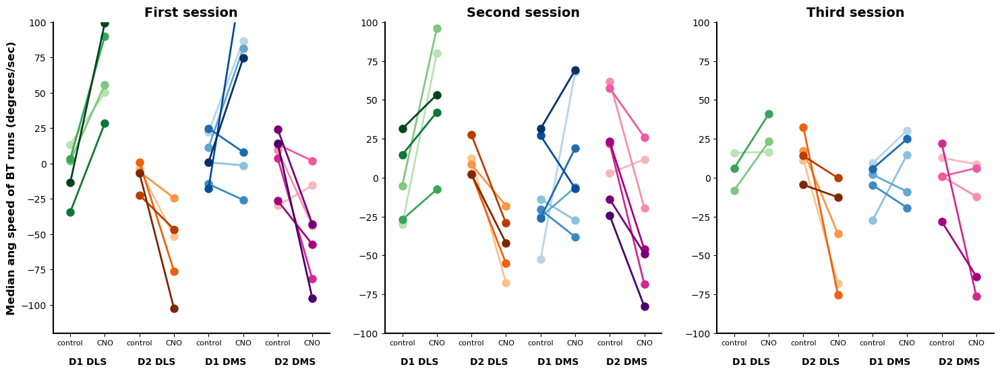

In [ ]:
# median angular speed of BT

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

compare_sessions_by_group(axs[0], median_angular_speed_BT, groups, session_indices, session_type="first", ylabel='Median ang speed of BT runs (degrees/sec)', ylim=(-120,100))
compare_sessions_by_group(axs[1], median_angular_speed_BT, groups, session_indices, session_type="second", ylabel=None, ylim=(-100,100))
compare_sessions_by_group(axs[2], median_angular_speed_BT, groups, session_indices, session_type="third", ylabel=None, ylim=(-100,100))

In [ ]:
# distance, time, mean speed, max speed
# Initialize counters and lists for run analysis

total_time_BT_dict = {}
total_distance_BT_dict = {}
meanspeed_BT_dict = {}
maxspeed_BT_dict = {}

for mouse in mice_list:
    total_time_BT_dict[mouse] = {}
    total_distance_BT_dict[mouse] = {}
    meanspeed_BT_dict[mouse] = {}
    maxspeed_BT_dict[mouse] = {}

    for session_index, session_name in enumerate(session_list[mouse]):

        total_time_BT = 0
        total_distance_BT = 0
        meanspeed_BT = []
        maxspeed_BT = []

        for run in runs_between_towers_dict[mouse][session_index]:
            start_index, end_index = run[0][0], run[0][1]
            run_X_position = X_positions_dict[mouse][session_index][start_index:end_index + 1]
            run_Y_position = Y_positions_dict[mouse][session_index][start_index:end_index + 1]
            run_duration = traject_time_dict[mouse][session_index][end_index] - traject_time_dict[mouse][session_index][start_index]
            distance_ran = np.sum(distances_dict[mouse][session_index][start_index:end_index])

            # Accumulate metrics
            total_time_BT += run_duration
            total_distance_BT += distance_ran
            meanspeed_BT.append(distance_ran / run_duration)
            maxspeed_BT.append(np.max(speeds_dict[mouse][session_index][start_index:end_index]))

        # Store results for this session in the dictionaries
        total_time_BT_dict[mouse][session_index] = total_time_BT
        total_distance_BT_dict[mouse][session_index] = total_distance_BT
        meanspeed_BT_dict[mouse][session_index] = np.mean(meanspeed_BT)
        maxspeed_BT_dict[mouse][session_index] = np.max(maxspeed_BT)

print(maxspeed_BT_dict)

{'MOU3867': {0: 40.493228367028465, 1: 43.771475045010874, 2: 47.68177304082125, 3: 68.51917693741548, 4: 51.22210330719575, 5: 54.00150049103584, 6: 48.8347093843957, 7: 66.27651253351931, 8: 55.368644532052244, 9: 54.66746940506273, 10: 54.56552427859414, 11: 57.19532599553435, 12: 60.60189595534, 13: 46.76075102840947, 14: 56.682722233840465, 15: 52.19489112525784, 16: 59.22414293894632, 17: 63.452966106890514, 18: 57.369280633360546, 19: 61.068822340465395, 20: 48.07601626451714, 21: 56.27785575012359, 22: 62.80496474927227, 23: 62.296420138026946, 24: 71.24267170714222, 25: 66.74674837802037, 26: 72.0033138237608, 27: 62.42057433260995, 28: 66.63607547046098, 29: 63.89242130689288, 30: 51.41906524212497, 31: 59.57707045507423, 32: 60.02596114760464, 33: 69.39691581497665, 34: 61.10904448364717, 35: 59.8723977769186, 36: 61.28282167583511, 37: 60.3768661453657, 38: 64.74382689564086, 39: 58.64105290236679, 40: 62.23708487572492, 41: 58.626132847737566, 42: 44.079083805779035, 43: 6

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


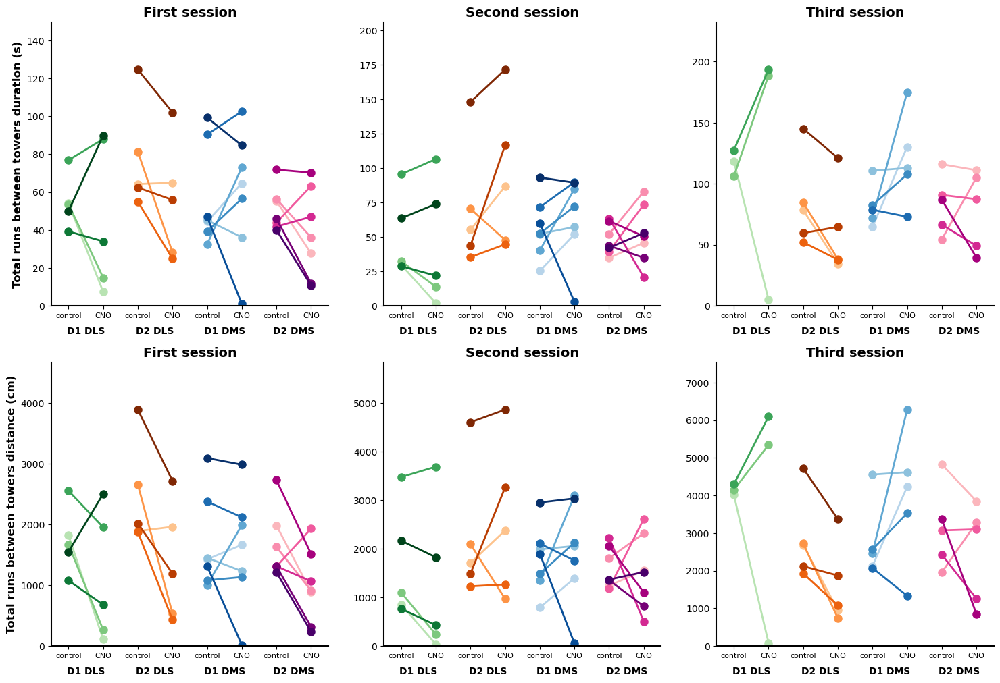

In [ ]:
# total runs between towers duration/distance

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], total_time_BT_dict, groups, session_indices, session_type="first", ylabel='Total runs between towers duration (s)')
compare_sessions_by_group(axs[0, 1], total_time_BT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], total_time_BT_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], total_distance_BT_dict, groups, session_indices, session_type="first", ylabel='Total runs between towers distance (cm)')
compare_sessions_by_group(axs[1, 1], total_distance_BT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], total_distance_BT_dict, groups, session_indices, session_type="third", ylabel=None)

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


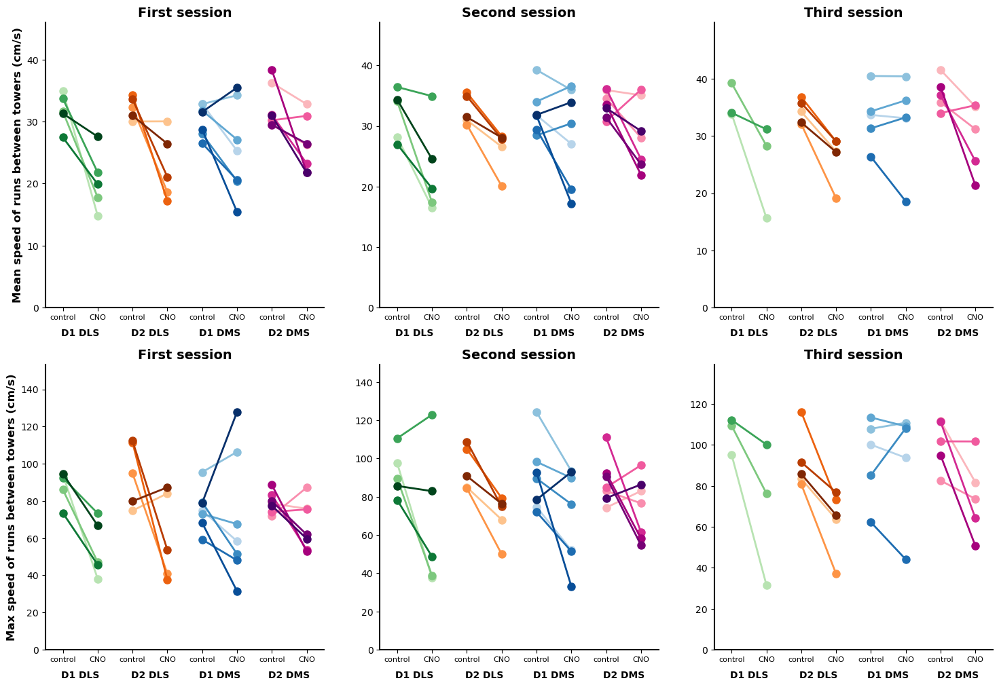

In [ ]:
# mean speed, max speed

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], meanspeed_BT_dict, groups, session_indices, session_type="first", ylabel='Mean speed of runs between towers (cm/s)')
compare_sessions_by_group(axs[0, 1], meanspeed_BT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], meanspeed_BT_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], maxspeed_BT_dict, groups, session_indices, session_type="first", ylabel='Max speed of runs between towers (cm/s)')
compare_sessions_by_group(axs[1, 1], maxspeed_BT_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], maxspeed_BT_dict, groups, session_indices, session_type="third", ylabel=None)

### Fourth : exploratory runs metrics

In [ ]:
# distance, time, mean speed, max speed
# Initialize counters and lists for run analysis

total_time_ER_dict = {}
total_distance_ER_dict = {}
meanspeed_ER_dict = {}
maxspeed_ER_dict = {}

for mouse in mice_list:

    total_time_ER_dict[mouse] = {}
    total_distance_ER_dict[mouse] = {}
    meanspeed_ER_dict[mouse] = {}
    maxspeed_ER_dict[mouse] = {}

    for session_index, session_name in enumerate(session_list[mouse]):

        total_time_ER = 0
        total_distance_ER = 0
        meanspeed_ER = []
        maxspeed_ER = []

        for run in exploratory_runs_dict[mouse][session_index]:
            start_index, end_index = run[0][0], run[0][1]
            run_X_position = X_positions_dict[mouse][session_index][start_index:end_index + 1]
            run_Y_position = Y_positions_dict[mouse][session_index][start_index:end_index + 1]
            run_duration = traject_time_dict[mouse][session_index][end_index] - traject_time_dict[mouse][session_index][start_index]
            distance_ran = np.sum(distances_dict[mouse][session_index][start_index:end_index])

            # Accumulate metrics
            total_time_ER += run_duration
            total_distance_ER += distance_ran
            meanspeed_ER.append(distance_ran / run_duration)
            maxspeed_ER.append(np.max(speeds_dict[mouse][session_index][start_index:end_index]))

        # Store results for this session in the dictionaries
        total_time_ER_dict[mouse][session_index] = total_time_ER
        total_distance_ER_dict[mouse][session_index] = total_distance_ER
        meanspeed_ER_dict[mouse][session_index] = np.mean(meanspeed_ER)
        maxspeed_ER_dict[mouse][session_index] = np.max(maxspeed_ER)


Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


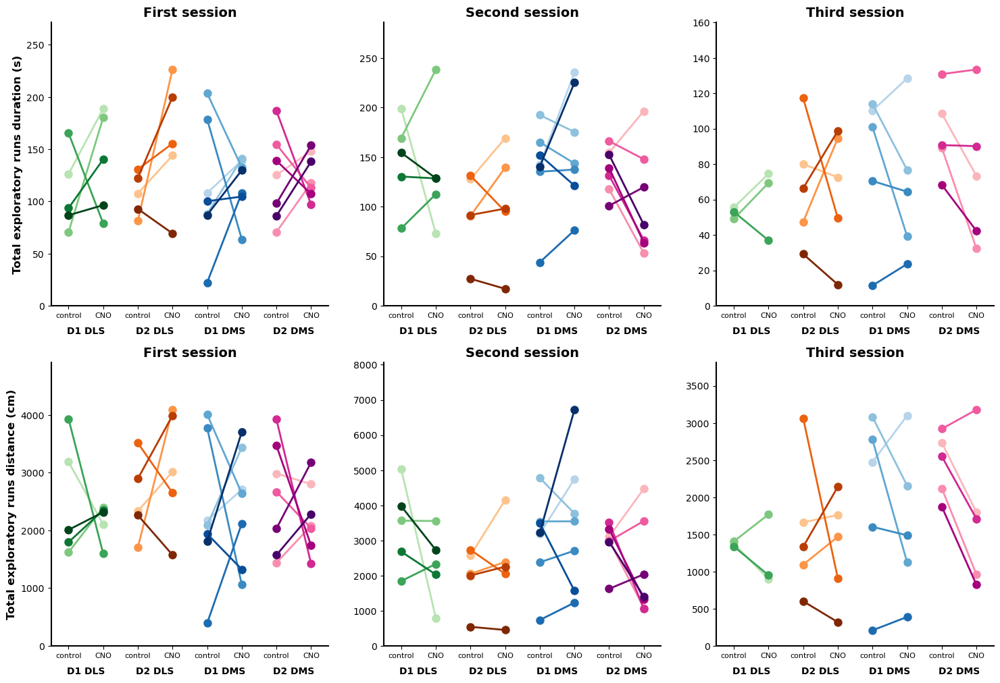

In [ ]:
# total explo runs duration/distance

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], total_time_ER_dict, groups, session_indices, session_type="first", ylabel='Total exploratory runs duration (s)')
compare_sessions_by_group(axs[0, 1], total_time_ER_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], total_time_ER_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], total_distance_ER_dict, groups, session_indices, session_type="first", ylabel='Total exploratory runs distance (cm)')
compare_sessions_by_group(axs[1, 1], total_distance_ER_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], total_distance_ER_dict, groups, session_indices, session_type="third", ylabel=None)

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


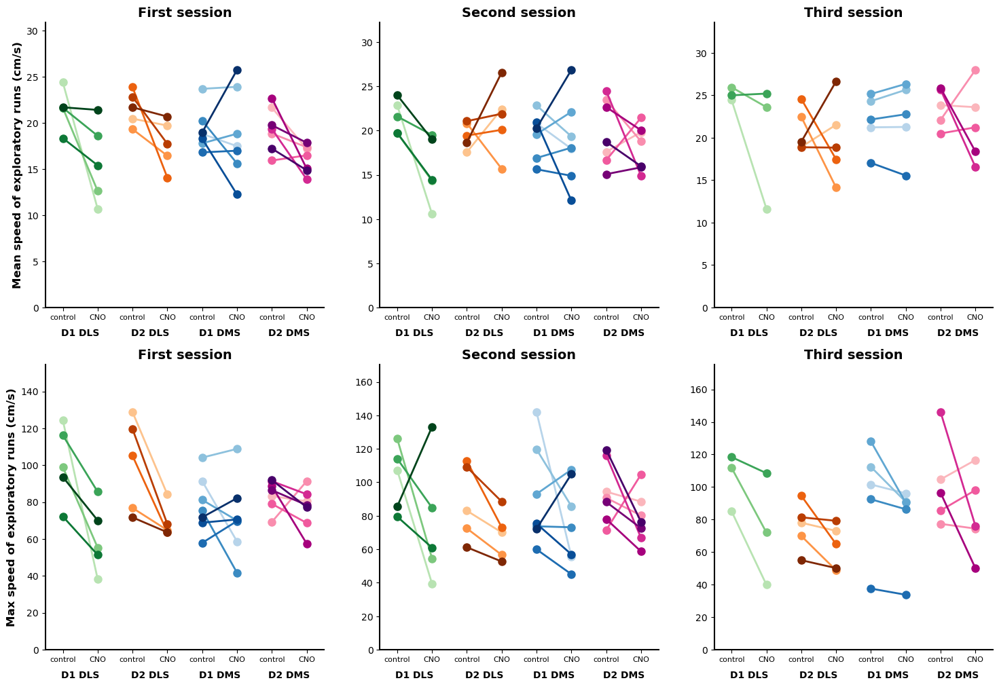

In [ ]:
# mean speed, max speed

# Créer une figure avec 2 lignes et 2 colonnes
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

compare_sessions_by_group(axs[0, 0], meanspeed_ER_dict, groups, session_indices, session_type="first", ylabel='Mean speed of exploratory runs (cm/s)')
compare_sessions_by_group(axs[0, 1], meanspeed_ER_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[0, 2], meanspeed_ER_dict, groups, session_indices, session_type="third", ylabel=None)

compare_sessions_by_group(axs[1, 0], maxspeed_ER_dict, groups, session_indices, session_type="first", ylabel='Max speed of exploratory runs (cm/s)')
compare_sessions_by_group(axs[1, 1], maxspeed_ER_dict, groups, session_indices, session_type="second", ylabel=None)
compare_sessions_by_group(axs[1, 2], maxspeed_ER_dict, groups, session_indices, session_type="third", ylabel=None)

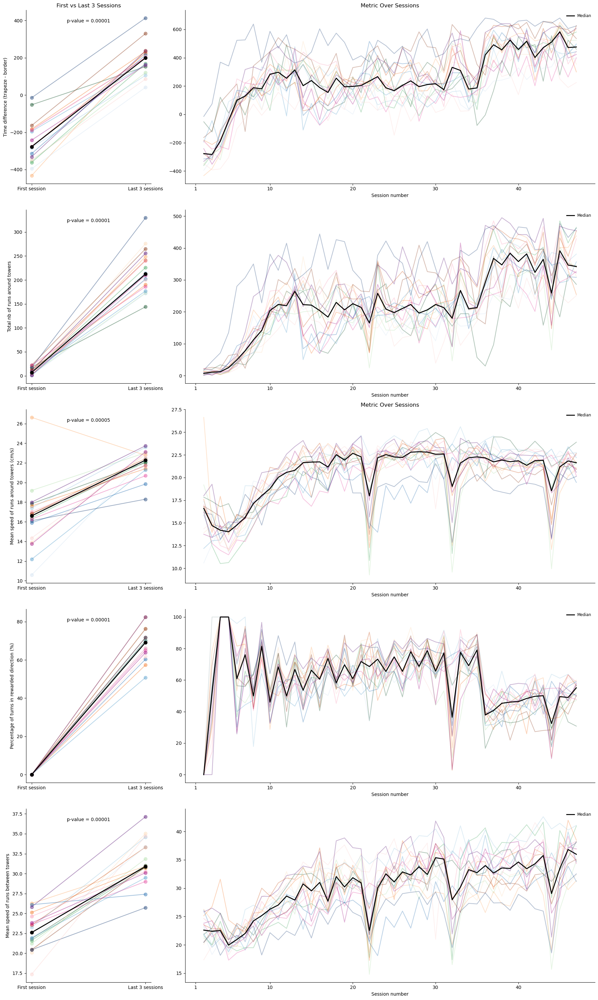

In [ ]:
fig = plt.figure(figsize=(18, 30))  # Ajuster la hauteur pour tenir les 5 lignes

# Créer un Gridspec avec 5 lignes et 3 colonnes
gs = fig.add_gridspec(5, 3, width_ratios=[1, 1, 2])  # 5 lignes, ajuster les colonnes pour refléter l'inversion

# Ligne 1
ax1_1 = fig.add_subplot(gs[0, 0])  # Ligne 0, colonne 0
plot_first_vs_last3(ax1_1, time_trapeze_minus_border, groups, colormaps, 
                    title="First vs Last 3 Sessions", ylabel="Time difference (trapeze - border)")

ax1_2 = fig.add_subplot(gs[0, 1:])  # Ligne 0, colonnes 1 et 2
plot_metric_over_sessions(ax1_2, time_trapeze_minus_border, groups, colormaps, 
                          title="Metric Over Sessions", ylabel=None)

# Ligne 2
ax2_1 = fig.add_subplot(gs[1, 0])  # Ligne 1, colonne 0
plot_first_vs_last3(ax2_1, total_QT_dict, groups, colormaps, 
                    title=None, ylabel="Total nb of runs around towers")

ax2_2 = fig.add_subplot(gs[1, 1:])  # Ligne 1, colonnes 1 et 2
plot_metric_over_sessions(ax2_2, total_QT_dict, groups, colormaps, 
                          title=None, ylabel=None)

# Ligne 3
ax3_1 = fig.add_subplot(gs[2, 0])  # Ligne 2, colonne 0
plot_first_vs_last3(ax3_1, meanspeed_QT_dict, groups, colormaps, 
                    title=None, ylabel="Mean speed of runs around towers (cm/s)")

ax3_2 = fig.add_subplot(gs[2, 1:])  # Ligne 2, colonnes 1 et 2
plot_metric_over_sessions(ax3_2, meanspeed_QT_dict, groups, colormaps, 
                          title="Metric Over Sessions", ylabel=None)

# Ligne 4
ax4_1 = fig.add_subplot(gs[3, 0])  # Ligne 3, colonne 0
plot_first_vs_last3(ax4_1, percentage_rewarded_dict, groups, colormaps, 
                    title=None, ylabel="Percentage of turns in rewarded direction (%)")

ax4_2 = fig.add_subplot(gs[3, 1:])  # Ligne 3, colonnes 1 et 2
plot_metric_over_sessions(ax4_2, percentage_rewarded_dict, groups, colormaps, 
                          title=None, ylabel=None)

# Ligne 5
ax5_1 = fig.add_subplot(gs[4, 0])  # Ligne 4, colonne 0
plot_first_vs_last3(ax5_1, meanspeed_BT_dict, groups, colormaps, 
                    title=None, ylabel="Mean speed of runs between towers")

ax5_2 = fig.add_subplot(gs[4, 1:])  # Ligne 4, colonnes 1 et 2
plot_metric_over_sessions(ax5_2, meanspeed_BT_dict, groups, colormaps, 
                          title=None, ylabel=None)

# Affichage avec un espacement automatique
plt.tight_layout()
plt.show()


# New analysis :
## 1. Analyse du biais directionnel et apprentissage de la règle procédurale
### Temps d’adaptation à la règle du jour : 

Quantifie le temps nécessaire aux animaux pour réaliser leur premier quart de tour correct au début de chaque session. 

Checker un palier de 10% (exemple arbitraire) de rewards atteint.

In [ ]:
# Example of how to find a key in runs_around_tower_dict

# print(runs_around_tower_dict["MOU3867"][0][0][3]['Rewarded'])

# for mouse in mice_list:
#     for session_index, session_name in enumerate(session_list[mouse]):
#         for run in runs_around_tower_dict[mouse][session_index]:
#             print(run[3]['Rewarded'])

In [ ]:
# Dictionnary to stock rewarded runs around tower
rewarded_QT_dict = {}
unrewarded_QT_dict = {}

# Parcourir chaque souris dans la liste des souris
for mouse in mice_list:
    rewarded_QT_dict[mouse] = {}  # Initialiser le sous-dictionnaire pour chaque souris
    unrewarded_QT_dict[mouse] = {}
    
    # Parcourir chaque session pour cette souris
    for session_index, session_name in enumerate(session_list[mouse]):
        # Filtrer les runs récompensés pour cette session
        rewarded_runs = [run for run in runs_around_tower_dict[mouse][session_index] if run[3]['Rewarded']]
        unrewarded_runs = [run for run in runs_around_tower_dict[mouse][session_index] if not run[3]['Rewarded']]
        
        # Ajouter uniquement les sessions avec des runs récompensés au dictionnaire
        rewarded_QT_dict[mouse][session_index] = rewarded_runs if rewarded_runs else []
        unrewarded_QT_dict[mouse][session_index] = unrewarded_runs if unrewarded_runs else []

# Afficher le dictionnaire des runs récompensés
print(unrewarded_QT_dict['MOU4623'][26])


[[[0, 21], ['SW', 'W'], ['SW', 'N'], {'Rewarded': False, 'direction': 'CW', 'num_trapezeswitch': 1}, {'epoch_time': 15.009, 'epoch_duration': 0.8420000000000005, 'epoch_distance': 11.856724391598418, 'epoch_meanspeed': 14.081620417575309, 'epoch_maxspeed': 22.786965748128864}], [[22, 40], ['SW', 'N'], ['SW', 'E'], {'Rewarded': False, 'direction': 'CW', 'num_trapezeswitch': 1}, {'epoch_time': 15.89, 'epoch_duration': 0.7210000000000001, 'epoch_distance': 16.363564358958676, 'epoch_meanspeed': 22.69565098329913, 'epoch_maxspeed': 38.392606163496815}], [[199, 214], ['NE', 'W'], ['NE', 'N'], {'Rewarded': False, 'direction': 'CW', 'num_trapezeswitch': 1}, {'epoch_time': 22.972, 'epoch_duration': 0.597999999999999, 'epoch_distance': 14.662985420346232, 'epoch_meanspeed': 24.52004250894023, 'epoch_maxspeed': 39.721730481840716}], [[229, 257], ['NE', 'N'], ['NE', 'E'], {'Rewarded': False, 'direction': 'CW', 'num_trapezeswitch': 1}, {'epoch_time': 24.173, 'epoch_duration': 1.120000000000001, 'e

In [ ]:
# Dictionnary to stock CW and CCW runs around tower

CW_QT_dict = {}
CCW_QT_dict = {}

# Parcourir chaque souris dans la liste des souris
for mouse in mice_list:
    CW_QT_dict[mouse] = {}  # Initialiser le sous-dictionnaire pour chaque souris
    CCW_QT_dict[mouse] = {}
    
    # Parcourir chaque session pour cette souris
    for session_index, session_name in enumerate(session_list[mouse]):
        # Filtrer les runs récompensés pour cette session
        CW_runs = [run for run in runs_around_tower_dict[mouse][session_index] if run[3]['direction']=='CW']
        CCW_runs = [run for run in runs_around_tower_dict[mouse][session_index] if run[3]['direction']=='CCW']
        
        # Ajouter uniquement les sessions avec des runs récompensés au dictionnaire
        if CW_runs:
            CW_QT_dict[mouse][session_index] = CW_runs
        if CCW_runs:
            CCW_QT_dict[mouse][session_index] = CCW_runs

# Afficher le dictionnaire des runs récompensés
print(CW_QT_dict['MOU4623'][0]) # Exemple d'une session et d'un animal pour éviter les bugs de chargement

[[[13610, 13631], ['NE', 'W'], ['NE', 'N'], {'Rewarded': True, 'direction': 'CW', 'num_trapezeswitch': 1}, {'epoch_time': 559.728, 'epoch_duration': 0.8390000000000555, 'epoch_distance': 15.480951756402792, 'epoch_meanspeed': 18.451670746605206, 'epoch_maxspeed': 42.06056916311134}], [[14471, 14491], ['SW', 'W'], ['SW', 'N'], {'Rewarded': True, 'direction': 'CW', 'num_trapezeswitch': 1}, {'epoch_time': 594.184, 'epoch_duration': 0.8029999999999973, 'epoch_distance': 11.127678846169804, 'epoch_meanspeed': 13.857632436077013, 'epoch_maxspeed': 23.39424273717153}]]


In [ ]:
# Retrieve all times between runs

def compute_all_time_deltas(run_type_dict, mice_list=None):
    """
    Calcule les intervalles de temps entre chaque run pour toutes les souris et toutes les sessions,
    et retourne un dictionnaire contenant les `time_deltas`. Si une `mice_list` est fournie, seul
    les souris de cette liste sont prises en compte.
    
    Args:
    - run_type_dict: Dictionnaire contenant les données des runs.
    - mice_list: Liste optionnelle des souris à considérer. Si None, toutes les souris sont utilisées.
    
    Retourne:
    - Un dictionnaire avec les time_deltas pour chaque souris et session.
    """
    # Si mice_list est None, utiliser toutes les souris dans run_type_dict
    if mice_list is None:
        mice_list = list(run_type_dict.keys())

    all_time_deltas = {}

    # Parcourir uniquement les souris spécifiées dans mice_list
    for mouse in mice_list:
        if mouse not in run_type_dict:
            print(f"{mouse} not in run type dictionnary.")
            continue  # Si la souris n'existe pas dans le dictionnaire, on passe à la suivante
        
        all_time_deltas[mouse] = {}  # Initialiser le sous-dictionnaire pour chaque souris
        
        for session_index, runs in run_type_dict[mouse].items():
            # Récupérer les epoch_times pour chaque run de la session actuelle
            epoch_times = [run[4]['epoch_time'] for run in runs]
            
            # Calculer les intervalles de temps entre chaque run
            time_deltas = [epoch_times[i+1] - epoch_times[i] for i in range(len(epoch_times) - 1)]
            
            # Ajouter les time_deltas pour cette session
            all_time_deltas[mouse][session_index] = time_deltas

    return all_time_deltas

all_time_deltas_QT = compute_all_time_deltas(runs_around_tower_dict)
all_time_deltas_rewarded = compute_all_time_deltas(rewarded_QT_dict)
all_time_deltas_CW = compute_all_time_deltas(CW_QT_dict)
all_time_deltas_CCW = compute_all_time_deltas(CCW_QT_dict)

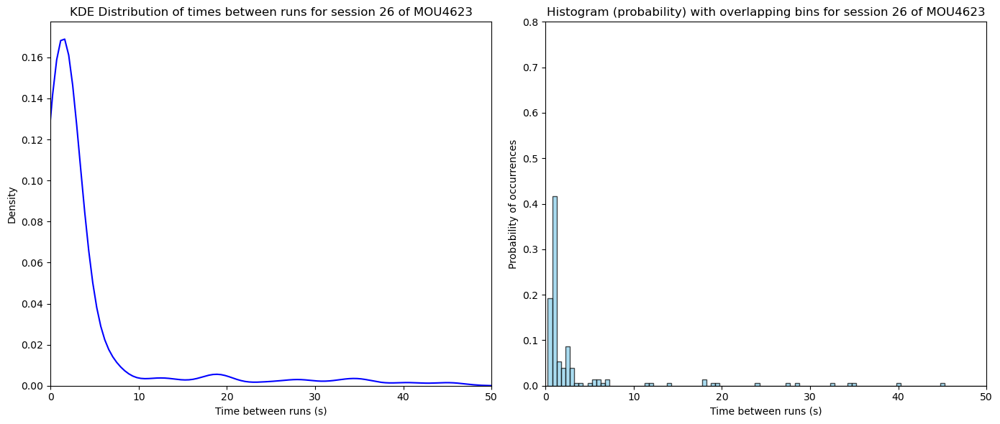

In [ ]:
# Plot distribution of times between two runs around tower

def plot_run_intervals_distrib(all_time_deltas, session_index=0, mouse=mice_list[0]):
    """
    Plot la distribution des intervalles de temps entre les runs pour une souris et une session données,
    en utilisant les time_deltas pré-calculés dans all_time_deltas.
    
    Args:
    - all_time_deltas: Dictionnaire contenant les time_deltas pour chaque souris et session.
    - session_index: L'index de la session à analyser.
    - mouse: La souris pour laquelle afficher les intervalles.
    """
    # Vérifier que la session existe pour la souris donnée dans all_time_deltas
    if mouse not in all_time_deltas or session_index not in all_time_deltas[mouse]:
        print(f"Error: Session {session_index} does not exist for mouse {mouse}.")
        return

    # Récupérer les time_deltas pour la souris et la session spécifiées
    time_deltas = all_time_deltas[mouse][session_index]
    
    fig, axs = plt.subplots(1, 2, figsize=(14, 6))

    # Méthode 1: Utiliser la KDE avec un 'bandwidth' de 2 pour des "bins coulissants"
    sns.kdeplot(time_deltas, bw_adjust=0.5, color='blue', ax=axs[0])  # bw_adjust ajuste la largeur pour approximer des bins de 2s
    axs[0].set_xlabel("Time between runs (s)")
    axs[0].set_ylabel("Density")
    axs[0].set_title(f"KDE Distribution of times between runs for session {session_index} of {mouse}")
    axs[0].set_xlim(0, 50)
    
    # Méthode 2: Histogramme en probabilité d'occurrence
    bin_width = 0.5  # Largeur des bins en secondes
    max_time = max(time_deltas)
    bins = np.arange(0, max_time + bin_width, bin_width)
    counts, _, _ = axs[1].hist(time_deltas, bins=bins, color='skyblue', edgecolor='black', alpha=0.7)

    # Convertir en probabilité d'occurrence
    counts_prob = counts / len(time_deltas)  # Calculer la probabilité pour chaque bin
    axs[1].clear()  # Effacer l'histogramme brut avant de replotter avec les probabilités
    axs[1].bar(bins[:-1], counts_prob, width=bin_width, color='skyblue', edgecolor='black', alpha=0.7)
    
    axs[1].set_xlabel("Time between runs (s)")
    axs[1].set_ylabel("Probability of occurrences")
    axs[1].set_title(f"Histogram (probability) with overlapping bins for session {session_index} of {mouse}")
    axs[1].set_xlim(0, 50)
    axs[1].set_ylim(0, 0.8)

    plt.tight_layout()
    plt.show()

# Exemple d'utilisation
plot_run_intervals_distrib(all_time_deltas_QT, session_index=26, mouse='MOU4623')


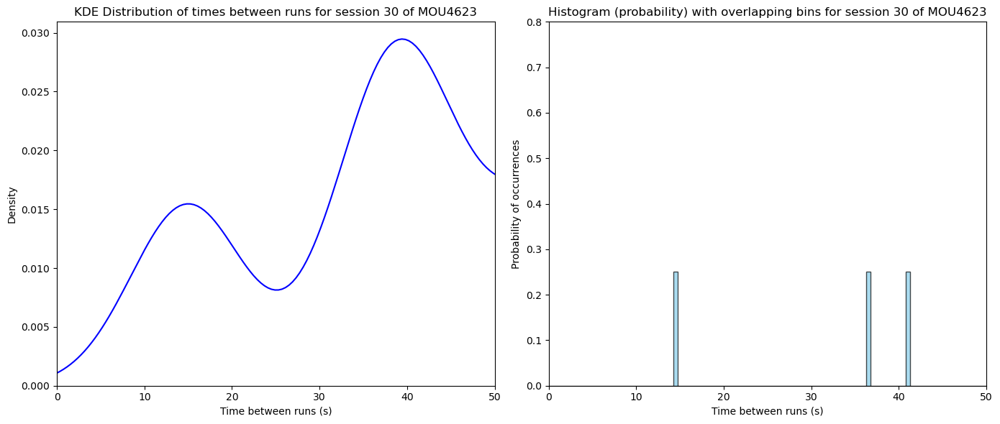

In [ ]:
# Plot distribution of times between two rewarded runs around tower

plot_run_intervals_distrib(all_time_deltas_rewarded, session_index=30, mouse='MOU4623')

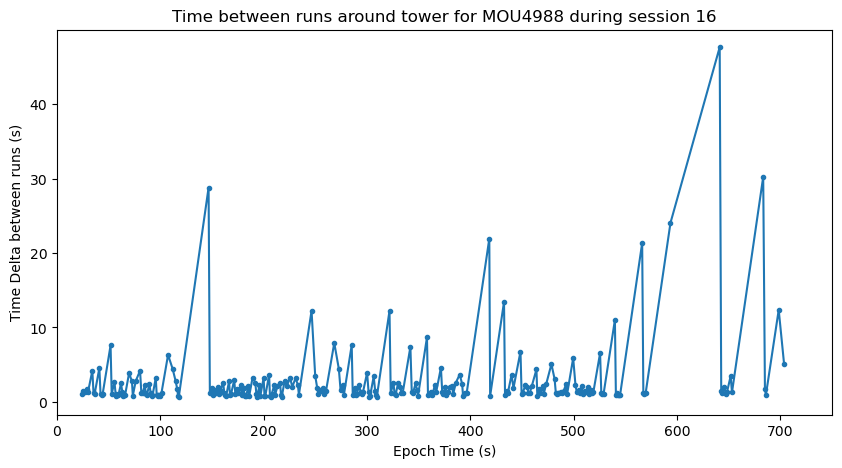

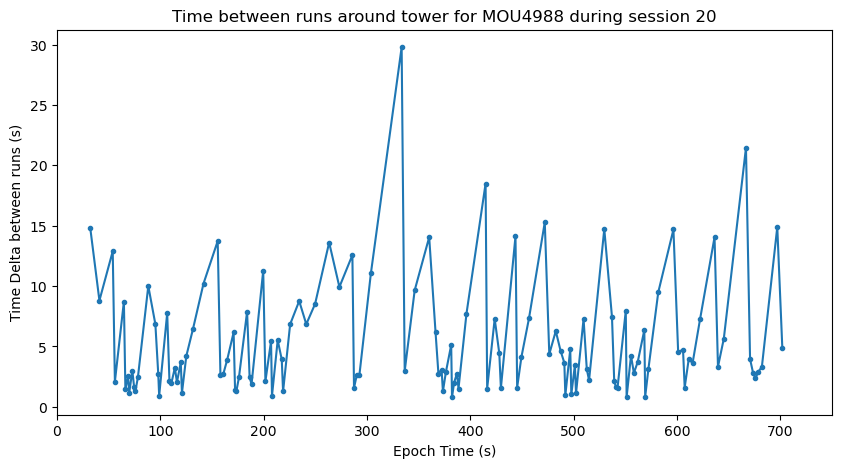

In [ ]:
# Plot time between runs during a session for 1 mouse

def plot_time_deltas_for_session(run_type_dict, all_time_deltas, run_type = 'undefined type of run', mouse=mice_list[0], session_index=0):
    """
    Plot les `time_deltas` pour une souris et une session spécifiques,
    en fonction de l'epoch_time du run suivant, en utilisant `all_time_deltas`.

    Args:
    - run_type_dict: Dictionnaire contenant les données des runs (avec les epoch_times).
    - all_time_deltas: Dictionnaire contenant les `time_deltas` calculés pour chaque souris et session.
    - mouse: La souris à analyser.
    - session_index: L'index de la session à analyser.
    """
    # Vérifiez si la souris et la session existent dans le dictionnaire
    if mouse not in run_type_dict or session_index not in run_type_dict[mouse]:
        print(f"Données manquantes pour {mouse} ou session {session_index}.")
        return
    
    if mouse not in all_time_deltas or session_index not in all_time_deltas[mouse]:
        print(f"Time deltas non trouvés pour {mouse} ou session {session_index}.")
        return

    # Récupérer les epoch_times et time_deltas pour cette session de la souris spécifiée
    runs = run_type_dict[mouse][session_index]
    epoch_times = [run[4]['epoch_time'] for run in runs]
    time_deltas = all_time_deltas[mouse][session_index]
    
    # On utilise l'epoch_time du run suivant comme point de temps pour chaque time_delta
    epoch_times_for_plot = epoch_times[1:]  # Ignorer le premier epoch_time car il n'y a pas de time_delta avant lui

    # Plotter les time_deltas en fonction des epoch_times correspondants
    plt.figure(figsize=(10, 5))
    plt.plot(epoch_times_for_plot, time_deltas, marker='o', linestyle='-', markersize=3)
    plt.xlabel('Epoch Time (s)')
    plt.ylabel('Time Delta between runs (s)')
    plt.title(f'Time between {run_type} for {mouse} during session {session_index}')
    plt.xlim(0,750)
    # plt.ylim(0,10)

# Exemples d'utilisation
plot_time_deltas_for_session(runs_around_tower_dict, all_time_deltas_QT, run_type = 'runs around tower', mouse='MOU4988', session_index=16)
plot_time_deltas_for_session(runs_around_tower_dict, all_time_deltas_QT, run_type = 'runs around tower', mouse='MOU4988', session_index=20)


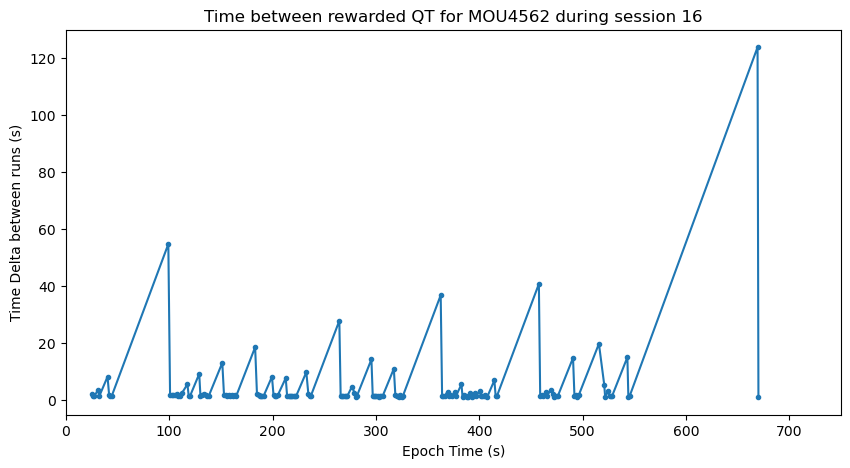

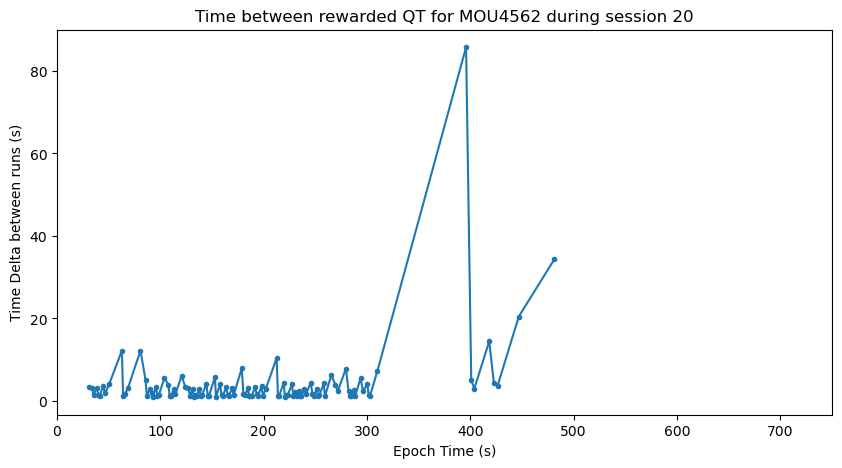

In [ ]:
# Same but for rewarded runs around tower

plot_time_deltas_for_session(rewarded_QT_dict, all_time_deltas_rewarded, run_type = 'rewarded QT', mouse='MOU4562', session_index=16)
plot_time_deltas_for_session(rewarded_QT_dict, all_time_deltas_rewarded, run_type = 'rewarded QT', mouse='MOU4562', session_index=20)

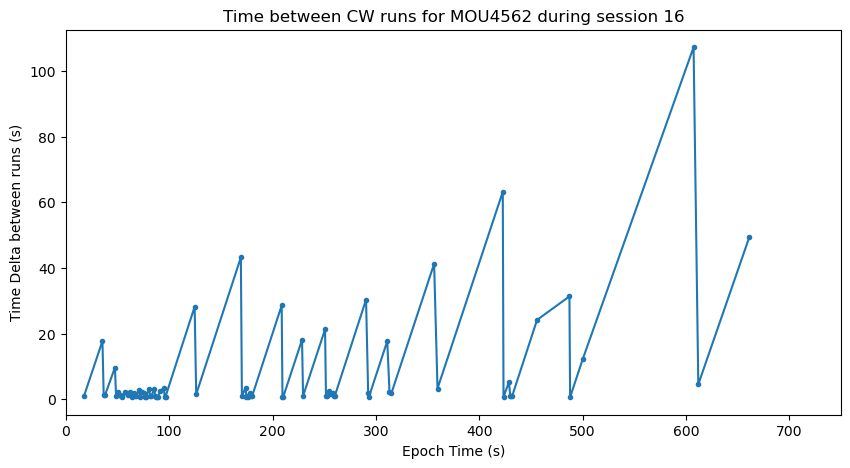

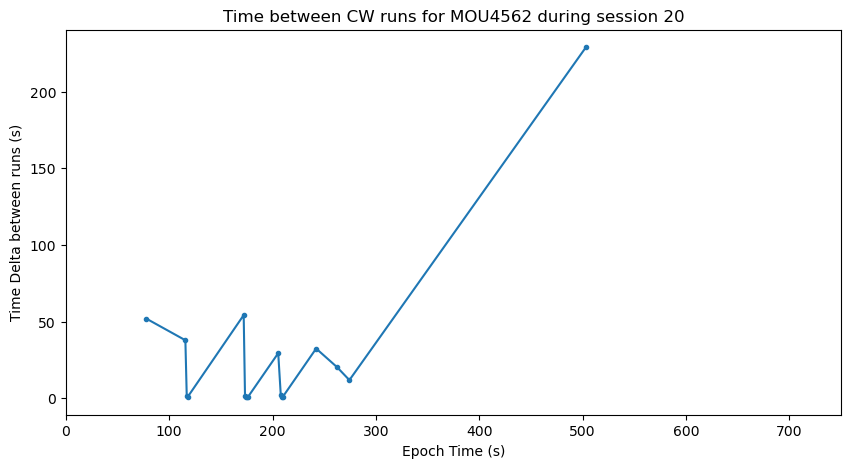

In [ ]:
# Same but for CW runs around tower

plot_time_deltas_for_session(CW_QT_dict, all_time_deltas_CW, run_type = 'CW runs', mouse='MOU4562', session_index=16)
plot_time_deltas_for_session(CW_QT_dict, all_time_deltas_CW, run_type = 'CW runs', mouse='MOU4562', session_index=20)

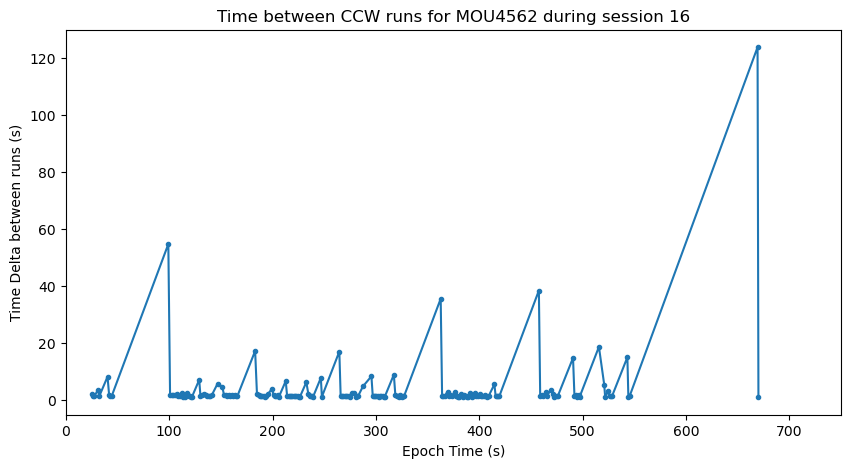

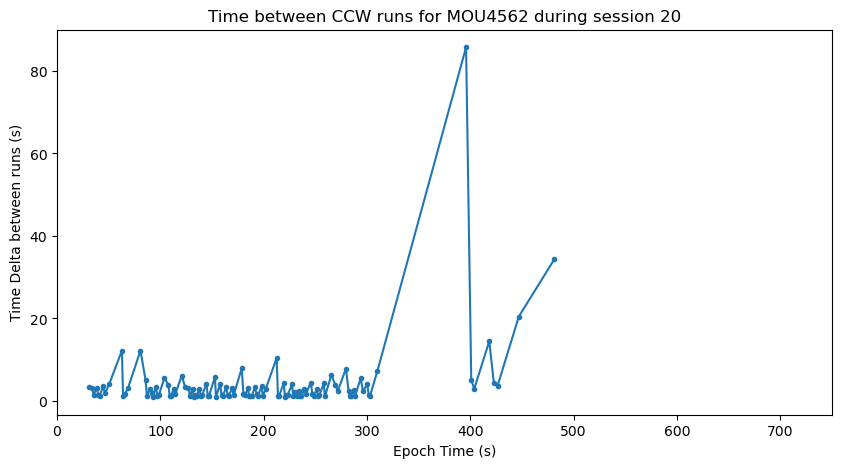

In [ ]:
# Same but for CCW runs around tower

plot_time_deltas_for_session(CCW_QT_dict, all_time_deltas_CCW, run_type = 'CCW runs', mouse='MOU4562', session_index=16)
plot_time_deltas_for_session(CCW_QT_dict, all_time_deltas_CCW, run_type = 'CCW runs', mouse='MOU4562', session_index=20)

In [ ]:
# Calculate median of +/-25-75 quartiles 

import numpy as np

def calculate_medians_and_quartiles(data_dict, session_indices):
    """
    Calcule les médianes et les quartiles 25 et 75 pour chaque souris dans les sessions
    'control' et 'CNO', et retourne deux dictionnaires : un pour les médianes et un pour les quartiles.
    
    Args:
    - data_dict: Le dictionnaire contenant les données des souris par session.
    - session_indices: Le dictionnaire des indices de session.
    
    Retourne:
    - median_dict: Dictionnaire des médianes pour chaque souris et session.
    - quartile_dict: Dictionnaire des quartiles (25 et 75) pour chaque souris et session.
    """
    median_dict = {}
    quartile_dict = {}

    for mouse, mouse_data in data_dict.items():
        median_dict[mouse] = {}
        quartile_dict[mouse] = {}

        for session_name, session_index in session_indices.items():
            # Vérifier que la session existe dans les données de la souris
            if session_index in mouse_data:
                session_data = mouse_data[session_index]
                # Calculer la médiane
                median_dict[mouse][session_index] = np.median(session_data)
                # Calculer les quartiles
                q25, q75 = np.percentile(session_data, [25, 75])
                quartile_dict[mouse][session_index] = (round(q25,3), round(q75,3))

    return median_dict, quartile_dict

median_dict_injections_QT, quartile_dict_injections_QT = calculate_medians_and_quartiles(all_time_deltas_QT, session_indices)
# print(quartile_dict_injections_QT)

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


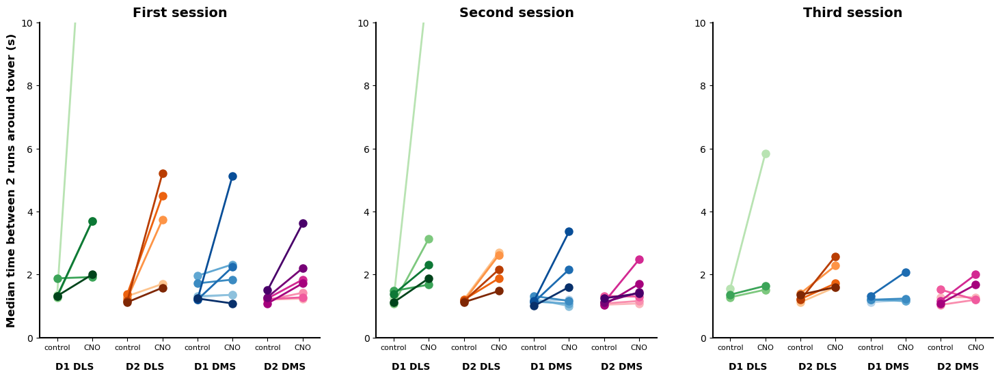

In [ ]:
# Plot median time between 2 runs around tower 
# Utiliser gridspec_kw pour ajuster l'espacement vertical
fig, axs = plt.subplots(1, 3, figsize=(18, 6), gridspec_kw={'hspace': 0.2})
ylim_median_time_QT = (0,10)

# Comparer les sessions en appelant la fonction pour chaque paire
compare_sessions_by_group(axs[0], median_dict_injections_QT, groups, session_indices, session_type="first", ylabel='Median time between 2 runs around tower (s)', ylim=ylim_median_time_QT, quartile_dict=quartile_dict_injections_QT)
compare_sessions_by_group(axs[1], median_dict_injections_QT, groups, session_indices, session_type="second", ylabel=None, ylim=ylim_median_time_QT, quartile_dict=quartile_dict_injections_QT)
compare_sessions_by_group(axs[2], median_dict_injections_QT, groups, session_indices, session_type="third", ylabel=None, ylim=ylim_median_time_QT, quartile_dict=quartile_dict_injections_QT)

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


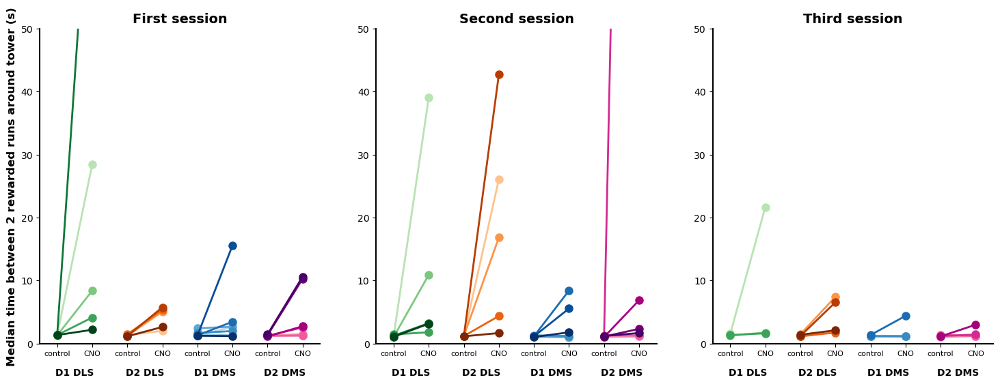

In [ ]:
median_dict_injections_rewarded, quartile_dict_injections_rewarded = calculate_medians_and_quartiles(all_time_deltas_rewarded, session_indices)

fig, axs = plt.subplots(1, 3, figsize=(18, 6), gridspec_kw={'hspace': 0.2})
ylim_median_time_rewarded = (0,50)

# Comparer les sessions en appelant la fonction pour chaque paire
compare_sessions_by_group(axs[0], median_dict_injections_rewarded, groups, session_indices, session_type="first", ylabel='Median time between 2 rewarded runs around tower (s)', ylim=ylim_median_time_rewarded, quartile_dict=quartile_dict_injections_rewarded)
compare_sessions_by_group(axs[1], median_dict_injections_rewarded, groups, session_indices, session_type="second", ylabel=None, ylim=ylim_median_time_rewarded, quartile_dict=quartile_dict_injections_rewarded)
compare_sessions_by_group(axs[2], median_dict_injections_rewarded, groups, session_indices, session_type="third", ylabel=None, ylim=ylim_median_time_rewarded, quartile_dict=quartile_dict_injections_rewarded)

In [ ]:
# Dictionnaire pour stocker les directions récompensées par session et par souris
rewarded_direction_per_session = {}

# Parcourir chaque souris dans la liste des souris
for mouse in mice_list:
    rewarded_direction_per_session[mouse] = {}  # Initialiser le sous-dictionnaire pour chaque souris
    
    # Parcourir chaque session de cette souris
    for session_index, session_name in enumerate(session_list[mouse]):
        # Construire le chemin d'accès au fichier CSV
        csv_file_path = os.path.join(path_to_data_folder, mouse, session_name, f"{session_name}_sessionparam.csv")
        
        # Lire le fichier CSV pour obtenir la colonne potentialRewardedDirections
        try:
            session_data = pd.read_csv(csv_file_path)
            rewarded_directions = session_data["potentialRewardedDirections"].iloc[0]  # Supposant que c'est dans la première ligne
            
            # Décoder la direction récompensée
            if rewarded_directions == "[90]":
                direction = "CCW"
            elif rewarded_directions == "[270]":
                direction = "CW"
            else:
                direction = "both"
            
            # Ajouter cette information dans le dictionnaire
            rewarded_direction_per_session[mouse][session_index] = direction

        except FileNotFoundError:
            print(f"Fichier {csv_file_path} non trouvé.")
        except Exception as e:
            print(f"Erreur lors de la lecture de {csv_file_path}: {e}")

# Afficher le dictionnaire final
# print(rewarded_direction_per_session['MOU4562'])


In [ ]:
# Just a test to check how to access to the percentage of turns in the rewarded direction

# for mouse in mice_list:
#     for session_index, session_name in enumerate(session_list[mouse]):
#         total_CW = run_around_tower_results_dict[mouse][session_index]['All']['total_CW']
#         total_CCW = run_around_tower_results_dict[mouse][session_index]['All']['total_CCW']
#         percentage_CW = (total_CW / (total_CW + total_CCW)) * 100
#         percentage_CCW = (total_CCW / (total_CW + total_CCW)) * 100
#         print(percentage_CCW) 

In [ ]:
# Plot the percentage of success before and after CNO : %turns in rewarded direction/total

def calculate_success_percentage(mice_list, results_dict, direction_dict, percentage_rewarded_dict):
    """
    Calcule le pourcentage de succès pour chaque session de chaque souris, en fonction de la direction
    récompensée de la session (CW, CCW, ou les deux directions).

    Args:
    - mice_list: Liste des souris à considérer.
    - results_dict: Dictionnaire contenant les résultats des runs pour chaque session de chaque souris.
    - direction_dict: Dictionnaire indiquant la direction récompensée pour chaque session de chaque souris.
    - percentage_rewarded_dict: Dictionnaire contenant le pourcentage global de réussite pour chaque session.

    Retourne:
    - Un dictionnaire avec les pourcentages de succès ajustés pour chaque souris et session.
    """
    success_percentage_dict = {}

    for mouse in mice_list:
        success_percentage_dict[mouse] = {}

        # Parcourir chaque session de la souris
        for session_index, session_name in enumerate(session_list[mouse]):
            # Récupérer la direction récompensée de la session
            rewarded_direction = direction_dict[mouse].get(session_index, "both")
            
            # Récupérer les résultats pour CW et CCW
            total_CW = results_dict[mouse][session_index]['All']['total_CW']
            total_CCW = results_dict[mouse][session_index]['All']['total_CCW']
            
            # Calculer les pourcentages pour CW et CCW
            if total_CW + total_CCW > 0:  # Éviter la division par zéro
                percentage_CW = round((total_CW / (total_CW + total_CCW)) * 100, 2)
                percentage_CCW = round((total_CCW / (total_CW + total_CCW)) * 100, 2)
            else:
                percentage_CW = percentage_CCW = 0  # Si aucun run, pourcentage de succès est 0
                
            # Sélectionner le pourcentage en fonction de la direction récompensée
            if rewarded_direction == "both":
                success_percentage = percentage_rewarded_dict[mouse][session_index]
            elif rewarded_direction == "CW":
                success_percentage = percentage_CW
            elif rewarded_direction == "CCW":
                success_percentage = percentage_CCW
            else:
                print(f"No rewarded direction defined for session {session_index}")
                success_percentage = 0  # Cas par défaut si une valeur imprévue est présente

            # Ajouter au dictionnaire
            success_percentage_dict[mouse][session_index] = success_percentage

    return success_percentage_dict

# Utilisation de la fonction
success_percentage_dict = calculate_success_percentage(mice_list, run_around_tower_results_dict, rewarded_direction_per_session, percentage_rewarded_dict)
# print(success_percentage_dict['MOU4562'])

Avertissement : données manquantes pour MOU4988 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5008 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4986 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU5007 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4964 dans les sessions de type 'third'
Avertissement : données manquantes pour MOU4965 dans les sessions de type 'third'


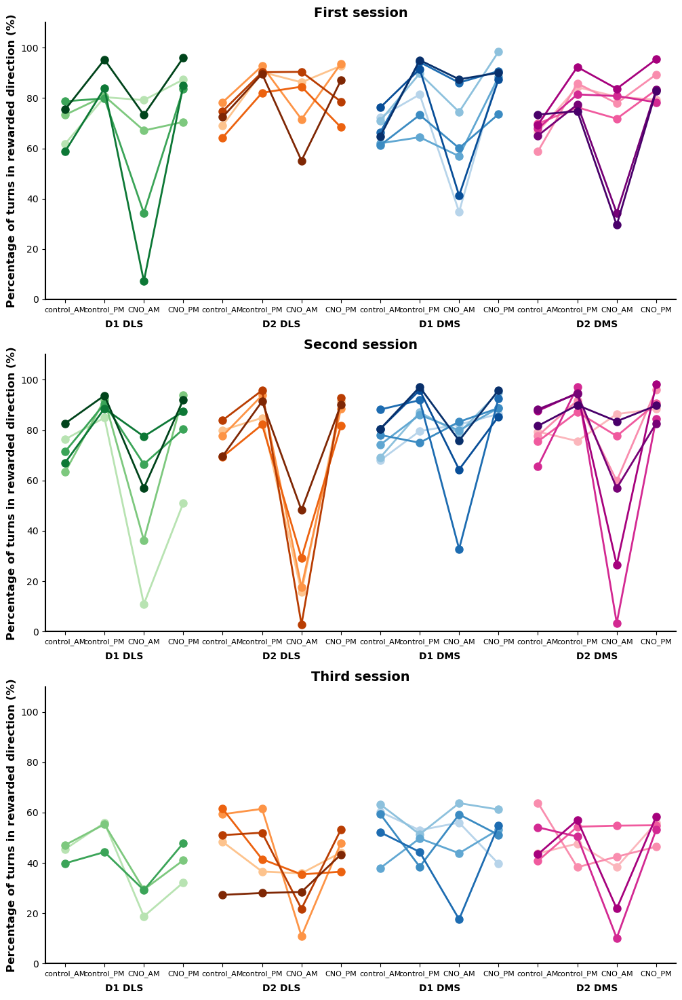

In [ ]:
def compare_four_sessions_by_group(ax, data_dict, groups, session_indices, session_type="first", ylabel=None, ylim=(0,110)):
    """
    Compare les pourcentages de succès pour quatre sessions (control_AM, CNO_AM, control_PM, CNO_PM) pour chaque groupe.

    Parameters:
    - ax: L'axe sur lequel le graphique sera tracé.
    - success_percentage_dict: Dictionnaire contenant les pourcentages de succès pour chaque session.
    - groups: Dictionnaire des groupes de souris à analyser, avec le nom du groupe comme clé et la liste des souris comme valeur.
    - session_indices: Dictionnaire des indices de sessions.
    - session_type: "first", "second", ou "third" pour déterminer les sessions à comparer.
    - ylabel: Label de l'axe Y pour le graphique.
    - ylim: Limite pour l'axe Y.
    """
    # Extraire les indices de sessions AM
    control_AM_index = session_indices.get(f"control_{session_type}")
    CNO_AM_index = session_indices.get(f"CNO_{session_type}")

    if control_AM_index is None or CNO_AM_index is None:
        print(f"Erreur : indices de session manquants pour le type '{session_type}'.")
        return
    
    # Calculer les indices pour PM en ajoutant 1 aux indices AM
    control_PM_index = control_AM_index + 1
    CNO_PM_index = CNO_AM_index + 1
    
    # Labels pour les quatre sessions
    session_labels = ["control_AM", "control_PM", "CNO_AM", "CNO_PM"]
    tick_positions = []
    group_annotations = []

    # Définir les colormaps pour chaque groupe
    colormaps = {
        "D1 DLS": "Greens",
        "D2 DLS": "Oranges",
        "D1 DMS": "Blues",
        "D2 DMS": "RdPu",
        "D1 dS": "Purples",
        "D2 dS": "OrRd"
    }
    
    # Parcourir chaque groupe pour extraire et tracer les données
    for i, (group_name, group_mice) in enumerate(groups.items()):
        group_session_data = {label: [] for label in session_labels}  # Conteneur pour les données des sessions du groupe
        
        # Extraire les données pour chaque souris du groupe
        for mouse in group_mice:
            # Vérifier la disponibilité des données pour chaque session
            if control_AM_index in data_dict[mouse] and \
               CNO_AM_index in data_dict[mouse] and \
               control_PM_index in data_dict[mouse] and \
               CNO_PM_index in data_dict[mouse]:

                # Ajouter les données de chaque session pour la souris
                group_session_data["control_AM"].append(data_dict[mouse][control_AM_index])
                group_session_data["CNO_AM"].append(data_dict[mouse][CNO_AM_index])
                group_session_data["control_PM"].append(data_dict[mouse][control_PM_index])
                group_session_data["CNO_PM"].append(data_dict[mouse][CNO_PM_index])
            else:
                print(f"Avertissement : données manquantes pour {mouse} dans les sessions de type '{session_type}'")

        # Position des ticks pour le groupe (4 par groupe : control_AM, CNO_AM, control_PM, CNO_PM)
        base_position = i * 4
        for j, label in enumerate(session_labels):
            tick_positions.append(base_position + j)

        # Ajouter une annotation pour le groupe centré entre les positions des sessions
        group_annotations.append((base_position + 1.5, group_name))  # Centre des quatre sessions
        
        # Récupérer la colormap pour le groupe
        cmap = plt.get_cmap(colormaps.get(group_name))
        colors = cmap(np.linspace(0.3, 1, len(group_mice)))

        # Tracer les points pour chaque souris dans le groupe
        for j in range(len(group_session_data["control_AM"])):
            data = [
                group_session_data["control_AM"][j],
                group_session_data["control_PM"][j],
                group_session_data["CNO_AM"][j],
                group_session_data["CNO_PM"][j]
            ]
            ax.plot(range(base_position, base_position + 4), data, color=colors[j], linewidth=2, linestyle='-', marker='o', markersize=8)
    
    # Ajouter des titres et des labels
    ax.set_title(f'{session_type.capitalize()} session', fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=12, fontweight='bold')

    # Définir les positions et labels des ticks sur l'axe X pour chaque session
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(session_labels * len(groups))  # Répéter les labels pour chaque groupe
    
    # Limiter l'axe Y pour ajouter de la marge
    all_data = [value for group_mice in groups.values() for mouse in group_mice
                for value in [data_dict[mouse].get(control_AM_index),
                              data_dict[mouse].get(CNO_AM_index),
                              data_dict[mouse].get(control_PM_index),
                              data_dict[mouse].get(CNO_PM_index)]
                if value is not None]
    ax.set_xlim(-0.5, len(groups) * 4 - 0.5)
    if ylim is None:
        ax.set_ylim(0, max(all_data) * 1.2)
    else:
        ax.set_ylim(ylim)

    # Ajouter les annotations pour les groupes sous chaque bloc de ticks
    for pos, group_name in group_annotations:
        ax.annotate(group_name, xy=(pos, -0.1), xycoords=('data', 'axes fraction'), ha='center', 
                    fontsize=10, fontweight='bold')

    # Suppression des grilles pour un look plus propre
    ax.grid(False)

    # Améliorer la lisibilité des axes
    ax.tick_params(axis='y', which='major', labelsize=10)
    ax.tick_params(axis='x', which='major', labelsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

# Utilisation de la fonction pour tracer les résultats
fig, axs = plt.subplots(3, 1, figsize=(12, 18))
compare_four_sessions_by_group(axs[0], success_percentage_dict, groups, session_indices, session_type="first", ylabel='Percentage of turns in rewarded direction (%)')
compare_four_sessions_by_group(axs[1], success_percentage_dict, groups, session_indices, session_type="second", ylabel='Percentage of turns in rewarded direction (%)')
compare_four_sessions_by_group(axs[2], success_percentage_dict, groups, session_indices, session_type="third", ylabel='Percentage of turns in rewarded direction (%)')


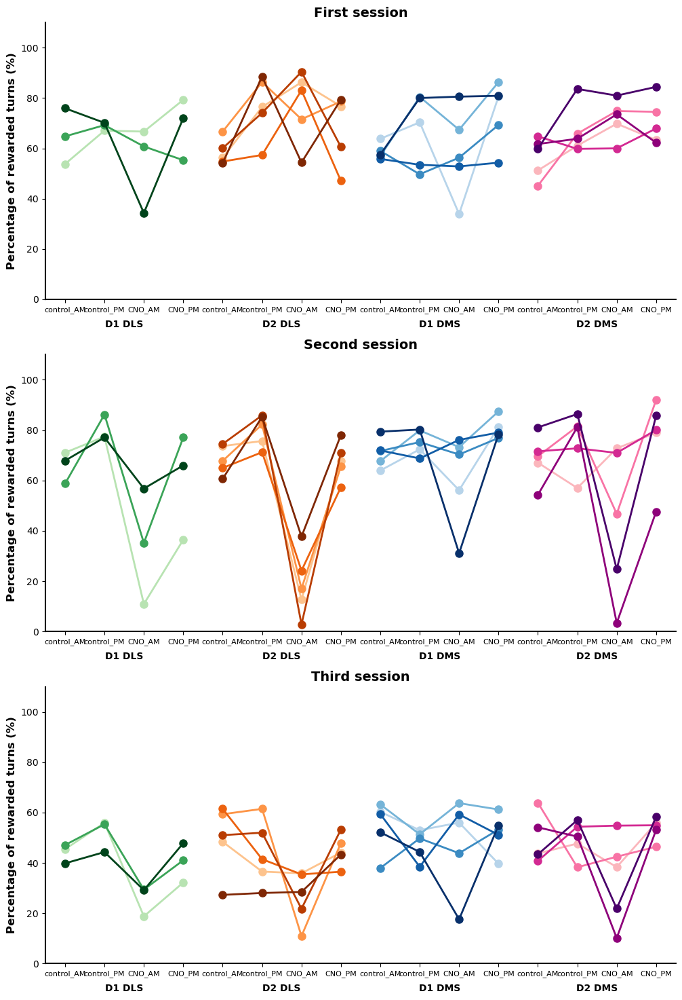

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(12, 18))
compare_four_sessions_by_group(axs[0], percentage_rewarded_dict, groups, session_indices, session_type="first", ylabel='Percentage of rewarded turns (%)')
compare_four_sessions_by_group(axs[1], percentage_rewarded_dict, groups, session_indices, session_type="second", ylabel='Percentage of rewarded turns (%)')
compare_four_sessions_by_group(axs[2], percentage_rewarded_dict, groups, session_indices, session_type="third", ylabel='Percentage of rewarded turns (%)')

KeyError: 40

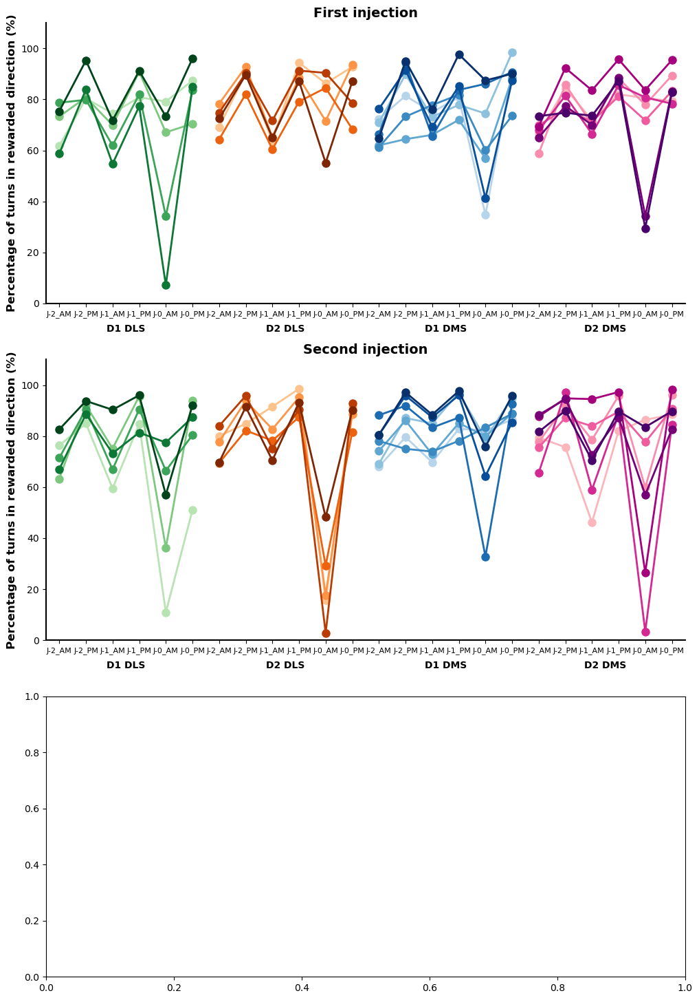

In [ ]:
def compare_six_sessions_by_group(ax, data_dict, groups, session_indices, session_type="first", ylabel=None, ylim=(0, 110)):
    """
    Compare les pourcentages de succès pour six sessions (J-2_AM, J-2_PM, J-1_AM, J-1_PM, J-0_AM, J-0_PM) pour chaque groupe.

    Parameters:
    - ax: L'axe sur lequel le graphique sera tracé.
    - data_dict: Dictionnaire contenant les données pour chaque session.
    - groups: Dictionnaire des groupes de souris à analyser, avec le nom du groupe comme clé et la liste des souris comme valeur.
    - session_indices: Dictionnaire des indices de sessions.
    - session_type: "first", "second", ou "third" pour déterminer les sessions à comparer.
    - ylabel: Label de l'axe Y pour le graphique.
    - ylim: Limite pour l'axe Y.
    """

    if session_type == "third":
        J_minus_1_AM_index = session_indices.get(f"control_{session_type}")
        J_minus_1_PM_index = J_minus_1_AM_index + 1
        J_0_AM_index = session_indices.get(f"CNO_{session_type}")
        J_0_PM_index = J_0_AM_index + 1

        if J_minus_1_AM_index is None or J_0_AM_index is None:
            print(f"Erreur : indices de session manquants pour le type '{session_type}'.")
            return
    else:
        J_minus_2_AM_index = session_indices.get(f"control_{session_type}")
        J_minus_2_PM_index = J_minus_2_AM_index + 1
        J_minus_1_AM_index = J_minus_2_PM_index + 1
        J_minus_1_PM_index = J_minus_1_AM_index + 1
        J_0_AM_index = session_indices.get(f"CNO_{session_type}")
        J_0_PM_index = J_0_AM_index + 1

    # Labels pour les six sessions
    if session_type == 'third':
        session_labels = ["J-1_AM", "J-1_PM", "J-0_AM", "J-0_PM"]
    else:
        session_labels = ["J-2_AM", "J-2_PM", "J-1_AM", "J-1_PM", "J-0_AM", "J-0_PM"]
    tick_positions = []
    group_annotations = []

    # Définir les colormaps pour chaque groupe
    colormaps = {
        "D1 DLS": "Greens",
        "D2 DLS": "Oranges",
        "D1 DMS": "Blues",
        "D2 DMS": "RdPu",
        "D1 dS": "Purples",
        "D2 dS": "OrRd",
        "D1": "GnBu",
        "D2": "YlOrBr",
        "All": "viridis"
    }

    # Parcourir chaque groupe pour extraire et tracer les données
    for i, (group_name, group_mice) in enumerate(groups.items()):
        group_session_data = {label: [] for label in session_labels}  # Conteneur pour les données des sessions du groupe

        # Extraire les données pour chaque souris du groupe
        for mouse in group_mice:
            # Vérifier la disponibilité des données pour chaque session
            group_session_data["J-1_AM"].append(data_dict[mouse][J_minus_1_AM_index])
            group_session_data["J-1_PM"].append(data_dict[mouse][J_minus_1_PM_index])
            group_session_data["J-0_AM"].append(data_dict[mouse][J_0_AM_index])
            group_session_data["J-0_PM"].append(data_dict[mouse][J_0_PM_index])
            if session_type != "third":
                group_session_data["J-2_AM"].append(data_dict[mouse][J_minus_2_AM_index])
                group_session_data["J-2_PM"].append(data_dict[mouse][J_minus_2_PM_index])

        # Position des ticks pour le groupe (6 par groupe)
        if session_type == 'third':
            base_position = i * 4 
        else: 
            base_position = i * 6
        for j, label in enumerate(session_labels):
            tick_positions.append(base_position + j)

        # Ajouter une annotation pour le groupe centré entre les positions des sessions
        group_annotations.append((base_position + 2.5, group_name))  # Centre des six sessions
        
        # Récupérer la colormap pour le groupe
        cmap = plt.get_cmap(colormaps.get(group_name))
        colors = cmap(np.linspace(0.3, 1, len(group_mice)))

        # Tracer les points pour chaque souris dans le groupe
        for j in range(len(group_session_data["J-1_AM"])):
            if session_type != "third":
                data = [
                    group_session_data["J-2_AM"][j],
                    group_session_data["J-2_PM"][j],
                    group_session_data["J-1_AM"][j],
                    group_session_data["J-1_PM"][j],
                    group_session_data["J-0_AM"][j],
                    group_session_data["J-0_PM"][j]
                ]
                ax.plot(range(base_position, base_position + 6), data, color=colors[j], linewidth=2, linestyle='-', marker='o', markersize=8)

            else: 
                data = [
                    group_session_data["J-1_AM"][j],
                    group_session_data["J-1_PM"][j],
                    group_session_data["J-0_AM"][j],
                    group_session_data["J-0_PM"][j]
                ]
                ax.plot(range(base_position, base_position + 4), data, color=colors[j], linewidth=2, linestyle='-', marker='o', markersize=8)
    
    # Ajouter des titres et des labels
    ax.set_title(f'{session_type.capitalize()} injection', fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=12, fontweight='bold')

    # Définir les positions et labels des ticks sur l'axe X pour chaque session
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(session_labels * len(groups))  # Répéter les labels pour chaque groupe

    # Limiter l'axe Y pour ajouter de la marge
    if session_type != "third":
        all_data = [value for group_mice in groups.values() for mouse in group_mice
                    for value in [data_dict[mouse].get(J_minus_2_AM_index),
                                data_dict[mouse].get(J_minus_2_PM_index),
                                data_dict[mouse].get(J_minus_1_AM_index),
                                data_dict[mouse].get(J_minus_1_PM_index),
                                data_dict[mouse].get(J_0_AM_index),
                                data_dict[mouse].get(J_0_PM_index)]
                    if value is not None]
        ax.set_xlim(-0.5, len(groups) * 6 - 0.5)
    else: 
        all_data = [value for group_mice in groups.values() for mouse in group_mice
            for value in [data_dict[mouse].get(J_minus_1_AM_index),
                            data_dict[mouse].get(J_minus_1_PM_index),
                            data_dict[mouse].get(J_0_AM_index),
                            data_dict[mouse].get(J_0_PM_index)]
            if value is not None]
        ax.set_xlim(-0.5, len(groups) * 4 - 0.5)


    if ylim is None:
        ax.set_ylim(0, max(all_data) * 1.2)
    else:
        ax.set_ylim(ylim)

    # Ajouter les annotations pour les groupes sous chaque bloc de ticks
    for pos, group_name in group_annotations:
        ax.annotate(group_name, xy=(pos, -0.1), xycoords=('data', 'axes fraction'), ha='center', 
                    fontsize=10, fontweight='bold')

    # Suppression des grilles pour un look plus propre
    ax.grid(False)

    # Améliorer la lisibilité des axes
    ax.tick_params(axis='y', which='major', labelsize=10)
    ax.tick_params(axis='x', which='major', labelsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)


# Utilisation de la fonction pour tracer les résultats
fig, axs = plt.subplots(3, 1, figsize=(12, 18))
compare_six_sessions_by_group(axs[0], success_percentage_dict, groups, session_indices, session_type="first", ylabel='Percentage of turns in rewarded direction (%)')
compare_six_sessions_by_group(axs[1], success_percentage_dict, groups, session_indices, session_type="second", ylabel='Percentage of turns in rewarded direction (%)')
compare_six_sessions_by_group(axs[2], success_percentage_dict, groups, session_indices, session_type="third", ylabel='Percentage of turns in rewarded direction (%)')


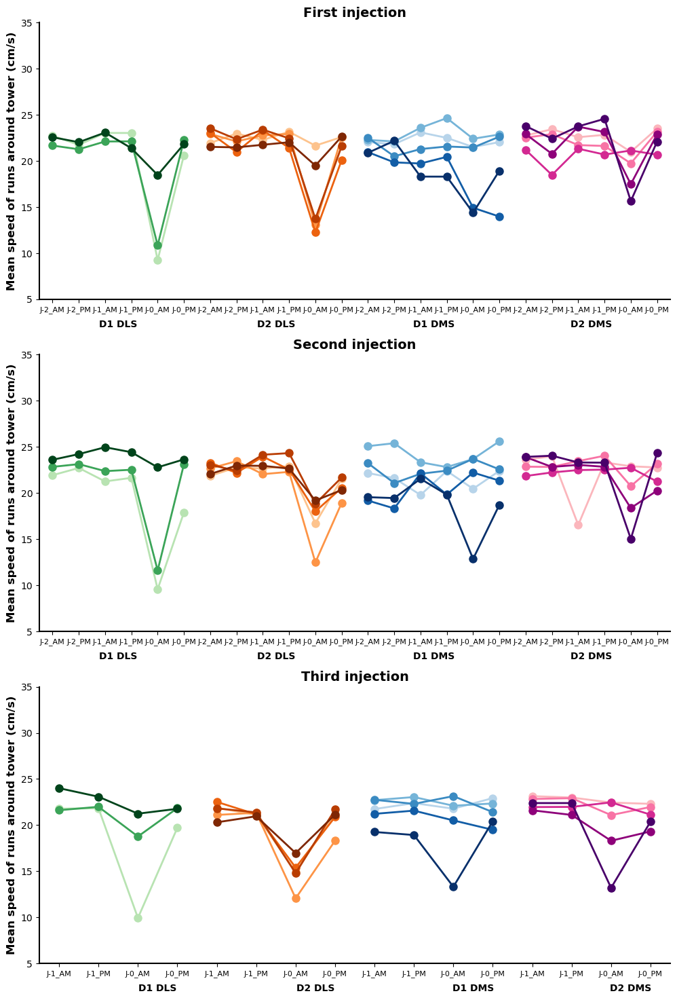

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(12, 18))

compare_six_sessions_by_group(axs[0], meanspeed_QT_dict, groups, session_indices, session_type="first", ylabel='Mean speed of runs around tower (cm/s)', ylim=(5,35))
compare_six_sessions_by_group(axs[1], meanspeed_QT_dict, groups, session_indices, session_type="second", ylabel='Mean speed of runs around tower (cm/s)', ylim=(5,35))
compare_six_sessions_by_group(axs[2], meanspeed_QT_dict, groups, session_indices, session_type="third", ylabel='Mean speed of runs around tower (cm/s)', ylim=(5,35))


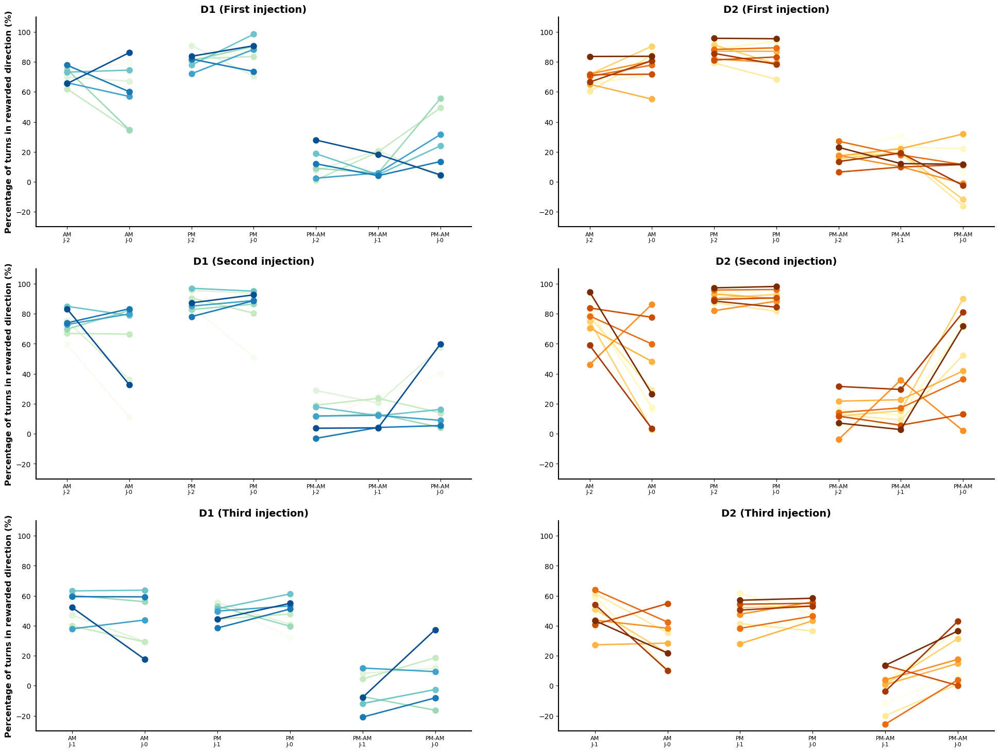

In [ ]:
def plot_stats_AM_PM(ax, data_dict, groups, session_indices, group_type="D1 DLS", session_type="first", ylabel=None, ylim=(0, 110)):
    """
    Plot les comparaisons entre plusieurs sessions avec les données AM et PM et des calculs spécifiques.

    Parameters:
    - ax: L'axe sur lequel le graphique sera tracé.
    - data_dict: Dictionnaire contenant les données pour chaque session.
    - groups: Dictionnaire des groupes de souris à analyser.
    - group_type: Le type de groupe (ex: "D1 DLS", "D2 DLS", etc.) à analyser.
    - session_indices: Dictionnaire des indices de sessions.
    - session_type: "first", "second", ou "third" pour déterminer les sessions à comparer.
    - ylabel: Label de l'axe Y pour le graphique.
    - ylim: Limite pour l'axe Y.
    """
    # Extraire les indices de sessions pour chaque cas
    if session_type == "third":
        J_minus_1_AM_index = session_indices.get(f"control_{session_type}")
        J_minus_1_PM_index = J_minus_1_AM_index + 1
        J_0_AM_index = session_indices.get(f"CNO_{session_type}")
        J_0_PM_index = J_0_AM_index + 1

        if J_minus_1_AM_index is None or J_0_AM_index is None:
            print(f"Erreur : indices de session manquants pour le type '{session_type}'.")
            return
    else:
        J_minus_2_AM_index = session_indices.get(f"control_{session_type}")
        J_minus_2_PM_index = J_minus_2_AM_index + 1
        J_minus_1_AM_index = J_minus_2_PM_index + 1
        J_minus_1_PM_index = J_minus_1_AM_index + 1
        J_0_AM_index = session_indices.get(f"CNO_{session_type}")
        J_0_PM_index = J_0_AM_index + 1

        if J_minus_2_AM_index is None or J_0_AM_index is None:
            print(f"Erreur : indices de session manquants pour le type '{session_type}'.")
            return

    # Couleur basée sur le type de groupe
    colormaps = {
        "D1 DLS": "Greens",
        "D2 DLS": "Oranges",
        "D1 DMS": "Blues",
        "D2 DMS": "RdPu",
        "D1 dS": "Purples",
        "D2 dS": "OrRd",
        "D1": "GnBu",
        "D2": "YlOrBr",
        "All": "viridis"
    }

    cmap = plt.get_cmap(colormaps.get(group_type))
    colors = cmap(np.linspace(0, 0.95, len(groups[group_type])))

    # Extraction et tracé des données
    base_position = 0
    for mouse_idx, mouse in enumerate(groups[group_type]):
        # Vérifier la disponibilité des données
        if all(index in data_dict[mouse] for index in 
               [J_minus_1_AM_index, J_minus_1_PM_index, J_0_AM_index, J_0_PM_index]):
            # Comparaison AM
            AM_data = [data_dict[mouse].get(J_minus_1_AM_index), data_dict[mouse].get(J_0_AM_index)]
            ax.plot(range(base_position, base_position + 2), AM_data, color=colors[mouse_idx], linestyle='-', marker='o', linewidth=2, markersize=8)

            # Comparaison PM
            PM_data = [data_dict[mouse].get(J_minus_1_PM_index), data_dict[mouse].get(J_0_PM_index)]
            ax.plot(range(base_position + 2, base_position + 4), PM_data, color=colors[mouse_idx], linestyle='-', marker='o', linewidth=2, markersize=8)

            # Comparaison PM-AM
            if session_type == "third":
                PM_AM_diffs = [
                    data_dict[mouse].get(J_minus_1_PM_index) - data_dict[mouse].get(J_minus_1_AM_index),
                    data_dict[mouse].get(J_0_PM_index) - data_dict[mouse].get(J_0_AM_index)
                ]
                ax.plot(range(base_position + 4, base_position + 6), PM_AM_diffs, color=colors[mouse_idx], linestyle='-', marker='o', linewidth=2, markersize=8)
            else:
                PM_AM_diffs = [
                    data_dict[mouse].get(J_minus_2_PM_index) - data_dict[mouse].get(J_minus_2_AM_index),
                    data_dict[mouse].get(J_minus_1_PM_index) - data_dict[mouse].get(J_minus_1_AM_index),
                    data_dict[mouse].get(J_0_PM_index) - data_dict[mouse].get(J_0_AM_index)
                ]
                ax.plot(range(base_position + 4, base_position + 7), PM_AM_diffs, color=colors[mouse_idx], linestyle='-', marker='o', linewidth=2, markersize=8)
        else:
            print(f"Avertissement : données manquantes pour {mouse} dans les sessions de type '{session_type}'")

    # Définir les ticks et labels dynamiquement
    if session_type == "third":
        tick_positions = [0, 1, 2, 3, 4, 5]
        tick_labels = [
            "AM\nJ-1", "AM\nJ-0",
            "PM\nJ-1", "PM\nJ-0",
            "PM-AM\nJ-1", "PM-AM\nJ-0"
        ]
    else:
        tick_positions = [0, 1, 2, 3, 4, 5, 6]
        tick_labels = [
            "AM\nJ-2", "AM\nJ-0",
            "PM\nJ-2", "PM\nJ-0",
            "PM-AM\nJ-2", "PM-AM\nJ-1", "PM-AM\nJ-0"
        ]

    # Ajouter des titres et des labels
    ax.set_title(f'{group_type} ({session_type.capitalize()} injection)', fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=12, fontweight='bold')

    # Définir les positions et labels des ticks sur l'axe X
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(tick_labels)

    # Limiter l'axe Y pour ajouter de la marge
    all_data = [value for mouse in groups[group_type]
                for value in [
                    data_dict[mouse].get(J_minus_2_AM_index) if session_type != "third" else None,
                    data_dict[mouse].get(J_minus_1_AM_index), data_dict[mouse].get(J_0_AM_index),
                    data_dict[mouse].get(J_minus_2_PM_index) if session_type != "third" else None,
                    data_dict[mouse].get(J_minus_1_PM_index), data_dict[mouse].get(J_0_PM_index)]
                if value is not None]

    ax.set_xlim(-0.5, len(tick_positions) - 0.5)
    if ylim is None:
        ax.set_ylim(0, max(all_data) * 1.2)
    else:
        ax.set_ylim(ylim)

    # Suppression des grilles pour un look plus propre
    ax.grid(False)

    # Améliorer la lisibilité des axes
    ax.tick_params(axis='y', which='major', labelsize=10)
    ax.tick_params(axis='x', which='major', labelsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

fig, axs = plt.subplots(3, 2, figsize=(24, 18))

plot_stats_AM_PM(axs[0,0], success_percentage_dict, groups_D1_D2, session_indices, group_type="D1", session_type="first", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[1,0], success_percentage_dict, groups_D1_D2, session_indices, group_type="D1", session_type="second", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[2,0], success_percentage_dict, groups_D1_D2, session_indices, group_type="D1", session_type="third", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[0,1], success_percentage_dict, groups_D1_D2, session_indices, group_type="D2", session_type="first", ylabel=None, ylim=(-30, 110))
plot_stats_AM_PM(axs[1,1], success_percentage_dict, groups_D1_D2, session_indices, group_type="D2", session_type="second", ylabel=None, ylim=(-30, 110))
plot_stats_AM_PM(axs[2,1], success_percentage_dict, groups_D1_D2, session_indices, group_type="D2", session_type="third", ylabel=None, ylim=(-30, 110))


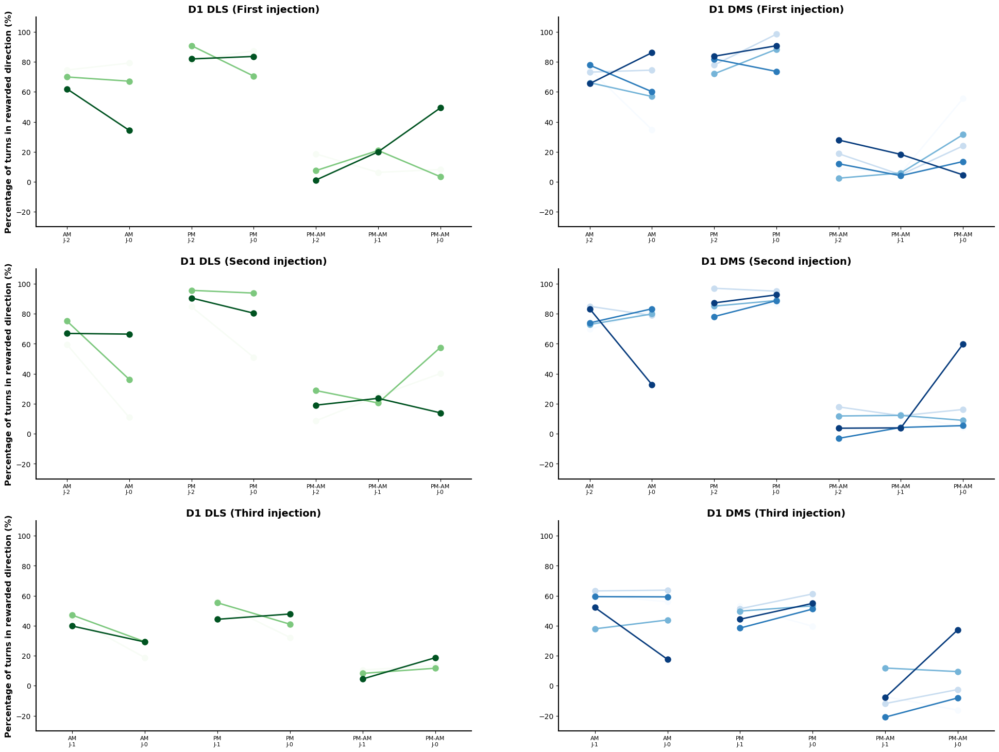

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(24, 18))

plot_stats_AM_PM(axs[0,0], success_percentage_dict, groups, session_indices, group_type="D1 DLS", session_type="first", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[1,0], success_percentage_dict, groups, session_indices, group_type="D1 DLS", session_type="second", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[2,0], success_percentage_dict, groups, session_indices, group_type="D1 DLS", session_type="third", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[0,1], success_percentage_dict, groups, session_indices, group_type="D1 DMS", session_type="first", ylabel=None, ylim=(-30, 110))
plot_stats_AM_PM(axs[1,1], success_percentage_dict, groups, session_indices, group_type="D1 DMS", session_type="second", ylabel=None, ylim=(-30, 110))
plot_stats_AM_PM(axs[2,1], success_percentage_dict, groups, session_indices, group_type="D1 DMS", session_type="third", ylabel=None, ylim=(-30, 110))

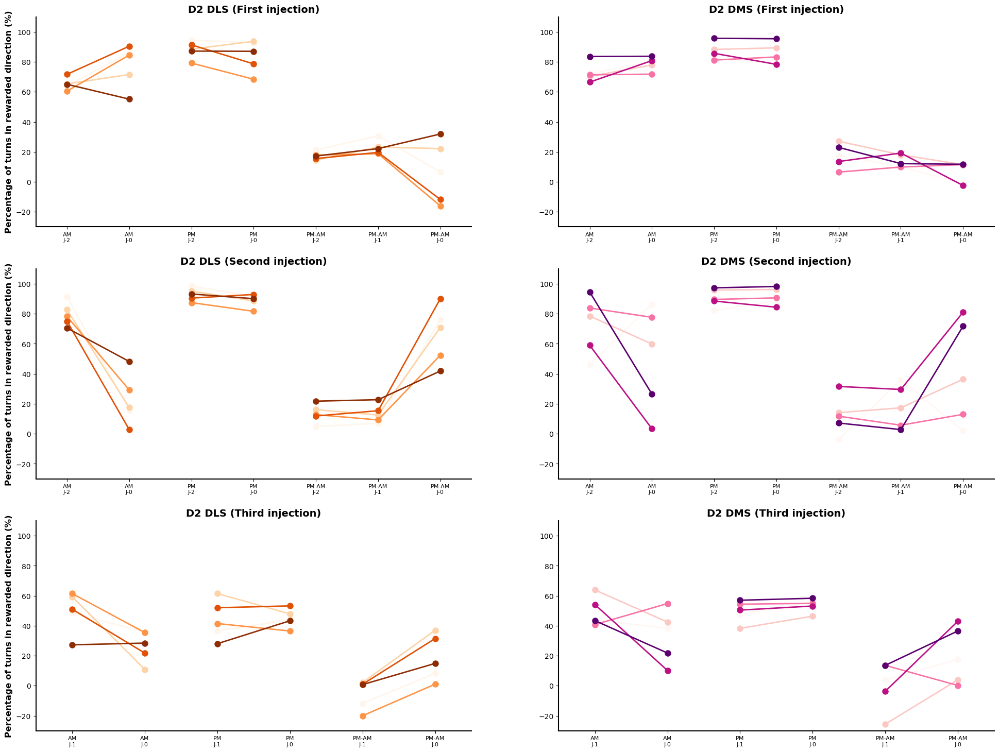

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(24, 18))

plot_stats_AM_PM(axs[0,0], success_percentage_dict, groups, session_indices, group_type="D2 DLS", session_type="first", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[1,0], success_percentage_dict, groups, session_indices, group_type="D2 DLS", session_type="second", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[2,0], success_percentage_dict, groups, session_indices, group_type="D2 DLS", session_type="third", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[0,1], success_percentage_dict, groups, session_indices, group_type="D2 DMS", session_type="first", ylabel=None, ylim=(-30, 110))
plot_stats_AM_PM(axs[1,1], success_percentage_dict, groups, session_indices, group_type="D2 DMS", session_type="second", ylabel=None, ylim=(-30, 110))
plot_stats_AM_PM(axs[2,1], success_percentage_dict, groups, session_indices, group_type="D2 DMS", session_type="third", ylabel=None, ylim=(-30, 110))

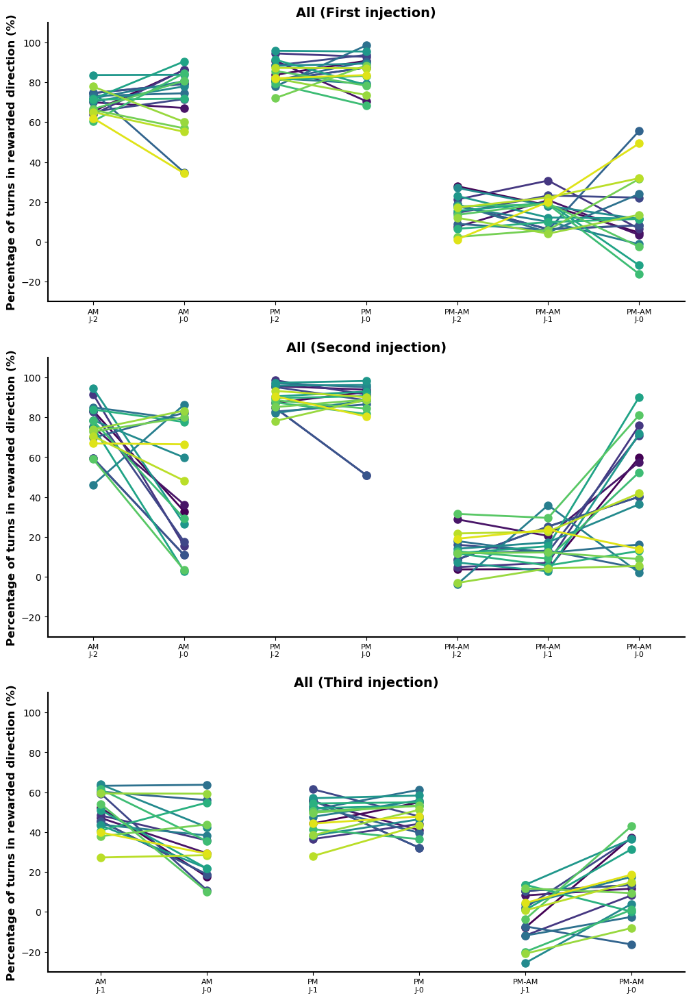

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(12, 18))

plot_stats_AM_PM(axs[0], success_percentage_dict, groups_D1_D2, session_indices, group_type="All", session_type="first", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[1], success_percentage_dict, groups_D1_D2, session_indices, group_type="All", session_type="second", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))
plot_stats_AM_PM(axs[2], success_percentage_dict, groups_D1_D2, session_indices, group_type="All", session_type="third", ylabel='Percentage of turns in rewarded direction (%)', ylim=(-30, 110))


In [ ]:
# def plot_correlation_angular_speed_success(ax, angular_speed_dict, success_dict, groups, session_indices, group_type="D1 DLS", session_type="first"):
#     """
#     Plot une corrélation entre la médiane des vitesses angulaires et les pourcentages de succès pour une session donnée.

#     Parameters:
#     - ax: L'axe sur lequel le graphique sera tracé.
#     - angular_speed_dict: Dictionnaire des vitesses angulaires médianes pour chaque session.
#     - success_dict: Dictionnaire des pourcentages de succès pour chaque session.
#     - groups: Dictionnaire des groupes de souris.
#     - session_indices: Dictionnaire des indices de sessions.
#     - group_type: Le type de groupe à analyser.
#     - session_type: Type de session ("first", "second", "third").
#     """
#     # Extraire les indices de sessions pour J-0_AM
#     J_0_AM_index = session_indices.get(f"CNO_{session_type}")
    
#     if J_0_AM_index is None:
#         print(f"Erreur : indice de session J-0_AM introuvable pour le type '{session_type}'.")
#         return
    
#     # Préparer les données pour la corrélation
#     angular_speeds = []
#     success_percentages = []
#     mice = groups[group_type]

#     for mouse in mice:
#         # Récupérer les données pour la session J-0_AM
#         angular_speed = angular_speed_dict[mouse].get(J_0_AM_index)
#         success_percentage = success_dict[mouse].get(J_0_AM_index)

#         # Vérifier si les deux données sont disponibles
#         if angular_speed is not None and success_percentage is not None:
#             angular_speeds.append(angular_speed)
#             success_percentages.append(success_percentage)

#     # Vérifier qu'il y a des données pour effectuer la corrélation
#     if not angular_speeds or not success_percentages:
#         print(f"Pas de données disponibles pour la corrélation dans le groupe '{group_type}' pour la session '{session_type}'.")
#         return
    
#     # Calcul de la corrélation (Pearson)
#     correlation_coefficient = np.corrcoef(angular_speeds, success_percentages)[0, 1]

#     if group_type == 'D2':
#         color_line = 'darkorange'
#         color_points = 'saddlebrown'
#     else: 
#         color_line = 'dodgerblue'
#         color_points = 'darkblue'
    
#     # Tracé du nuage de points
#     ax.scatter(angular_speeds, success_percentages, color=color_points, alpha=0.7, label=f"r={correlation_coefficient:.2f}")

#     # Ajustement d'une régression linéaire
    
#     slope, intercept = np.polyfit(angular_speeds, success_percentages, 1)
#     regression_line = np.polyval([slope, intercept], angular_speeds)
#     ax.plot(angular_speeds, regression_line, color=color_line, linestyle="-", label="Linear regression")

#     # Titres et labels
#     ax.set_title(f"Correlation {group_type} ({session_type.capitalize()} injection)", fontsize=14, fontweight="bold")
#     ax.set_xlabel("Median of angular speed (degree/s)", fontsize=12)
#     ax.set_ylabel("Choice accuracy (%)", fontsize=12)
#     ax.legend(fontsize=10)

#     # Amélioration de l'apparence
#     ax.grid(True, linestyle="--", alpha=0.5)
#     ax.spines["top"].set_visible(False)
#     ax.spines["right"].set_visible(False)

# fig, axs = plt.subplots(3,2, figsize=(16, 18))

# plot_correlation_angular_speed_success(axs[0,0], median_angular_speed_BT, success_percentage_dict, groups_D1_D2, session_indices, group_type="D1", session_type="first")
# plot_correlation_angular_speed_success(ax=axs[1,0], angular_speed_dict=median_angular_speed_BT, success_dict=success_percentage_dict, groups=groups_D1_D2, session_indices=session_indices, group_type="D1", session_type="second")
# plot_correlation_angular_speed_success(ax=axs[2,0], angular_speed_dict=median_angular_speed_BT, success_dict=success_percentage_dict, groups=groups_D1_D2, session_indices=session_indices, group_type="D1", session_type="third")
# plot_correlation_angular_speed_success(ax=axs[0,1], angular_speed_dict=median_angular_speed_BT, success_dict=success_percentage_dict, groups=groups_D1_D2, session_indices=session_indices, group_type="D2", session_type="first")
# plot_correlation_angular_speed_success(ax=axs[1,1], angular_speed_dict=median_angular_speed_BT, success_dict=success_percentage_dict, groups=groups_D1_D2, session_indices=session_indices, group_type="D2", session_type="second")
# plot_correlation_angular_speed_success(ax=axs[2,1], angular_speed_dict=median_angular_speed_BT, success_dict=success_percentage_dict, groups=groups_D1_D2, session_indices=session_indices, group_type="D2", session_type="third")

# plt.tight_layout()
# plt.show()


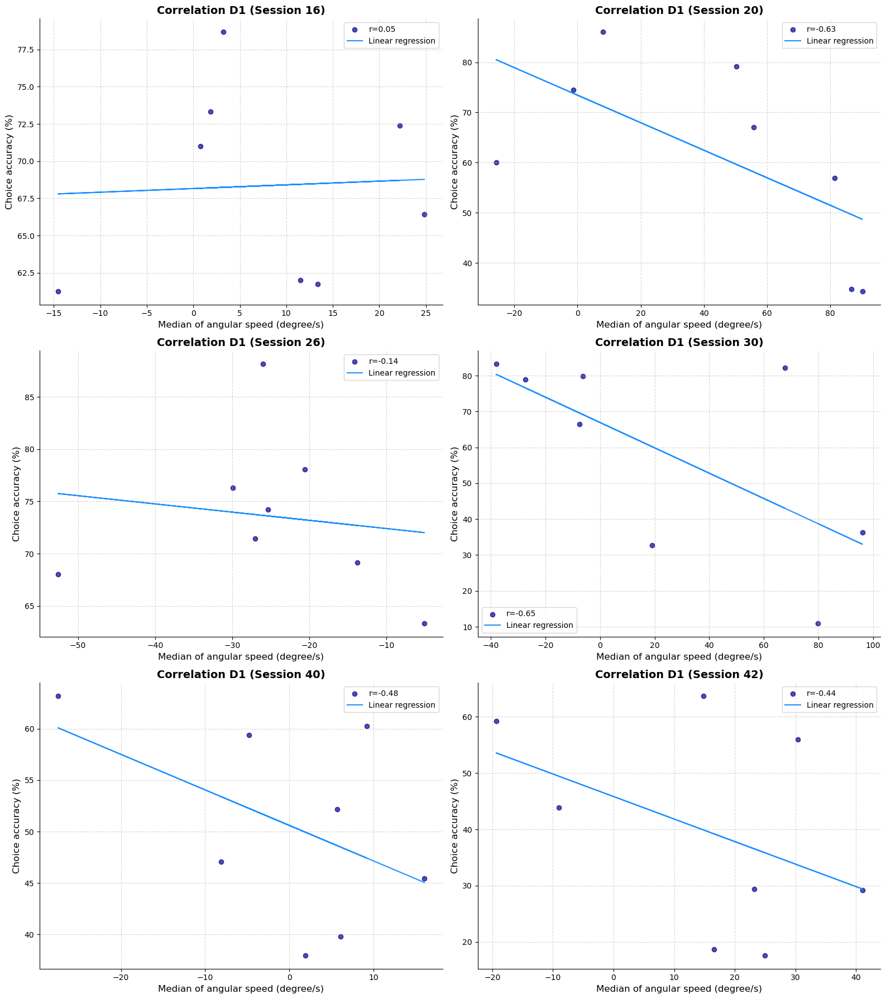

In [ ]:
def plot_correlation_angular_speed_success(ax, angular_speed_dict, success_dict, groups, session_indices=None, session_index=None, group_type="D1 DLS", session_type="first"):
    """
    Plot une corrélation entre la médiane des vitesses angulaires et les pourcentages de succès pour une session donnée.

    Parameters:
    - ax: L'axe sur lequel le graphique sera tracé.
    - angular_speed_dict: Dictionnaire des vitesses angulaires médianes pour chaque session.
    - success_dict: Dictionnaire des pourcentages de succès pour chaque session.
    - groups: Dictionnaire des groupes de souris.
    - session_indices: (Optionnel) Dictionnaire des indices de sessions.
    - session_index: (Optionnel) Index de session à analyser directement.
    - group_type: Le type de groupe à analyser.
    - session_type: (Optionnel) Type de session ("first", "second", "third"). Utilisé si `session_index` n'est pas fourni.
    """
    # Vérifier si un index de session est donné
    if session_index is not None:
        # Utiliser directement l'index fourni
        selected_session_index = session_index
    else:
        # Vérifier que session_indices et session_type sont valides
        if session_indices is None:
            print("Erreur : 'session_indices' doit être fourni si 'session_index' n'est pas spécifié.")
            return
        selected_session_index = session_indices.get(f"CNO_{session_type}")
        if selected_session_index is None:
            print(f"Erreur : indice de session introuvable pour le type '{session_type}'.")
            return
    
    # Préparer les données pour la corrélation
    angular_speeds = []
    success_percentages = []
    mice = groups[group_type]

    for mouse in mice:
        # Récupérer les données pour la session donnée
        angular_speed = angular_speed_dict[mouse].get(selected_session_index)
        success_percentage = success_dict[mouse].get(selected_session_index)

        # Vérifier si les deux données sont disponibles
        if angular_speed is not None and success_percentage is not None:
            angular_speeds.append(angular_speed)
            success_percentages.append(success_percentage)

    # Vérifier qu'il y a des données pour effectuer la corrélation
    if not angular_speeds or not success_percentages:
        print(f"Pas de données disponibles pour la corrélation dans le groupe '{group_type}' pour l'index de session {selected_session_index}.")
        return
    
    # Calcul de la corrélation (Pearson)
    correlation_coefficient = np.corrcoef(angular_speeds, success_percentages)[0, 1]

    if group_type == 'D2':
        color_line = 'darkorange'
        color_points = 'saddlebrown'
    else: 
        color_line = 'dodgerblue'
        color_points = 'darkblue'
    
    # Tracé du nuage de points
    ax.scatter(angular_speeds, success_percentages, color=color_points, alpha=0.7, label=f"r={correlation_coefficient:.2f}")

    # Ajustement d'une régression linéaire
    slope, intercept = np.polyfit(angular_speeds, success_percentages, 1)
    regression_line = np.polyval([slope, intercept], angular_speeds)
    ax.plot(angular_speeds, regression_line, color=color_line, linestyle="-", label="Linear regression")

    # Titres et labels
    ax.set_title(f"Correlation {group_type} (Session {selected_session_index})", fontsize=14, fontweight="bold")
    ax.set_xlabel("Median of angular speed (degree/s)", fontsize=12)
    ax.set_ylabel("Choice accuracy (%)", fontsize=12)
    ax.legend(fontsize=10)

    # Amélioration de l'apparence
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

fig, axs = plt.subplots(3, 2, figsize=(16, 18))

plot_correlation_angular_speed_success(axs[0,0], median_angular_speed_BT, success_percentage_dict, groups_D1_D2, session_indices, session_index=16, group_type="D1", session_type="first")
plot_correlation_angular_speed_success(axs[1,0], median_angular_speed_BT, success_percentage_dict, groups_D1_D2, session_indices, session_index=26, group_type="D1", session_type="second")
plot_correlation_angular_speed_success(axs[2,0], median_angular_speed_BT, success_percentage_dict, groups_D1_D2, session_indices, session_index=40, group_type="D1", session_type="third")
plot_correlation_angular_speed_success(axs[0,1], median_angular_speed_BT, success_percentage_dict, groups_D1_D2, session_indices, session_index=20, group_type="D1", session_type="first")
plot_correlation_angular_speed_success(axs[1,1], median_angular_speed_BT, success_percentage_dict, groups_D1_D2, session_indices, session_index=30, group_type="D1", session_type="second")
plot_correlation_angular_speed_success(axs[2,1], median_angular_speed_BT, success_percentage_dict, groups_D1_D2, session_indices, session_index=42, group_type="D1", session_type="third")

# plot_correlation_angular_speed_success(ax, angular_speed_dict, success_dict, groups, session_indices=None, session_index=None, group_type="D1 DLS", session_type="first")

plt.tight_layout()
plt.show()


/home/david/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/david/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


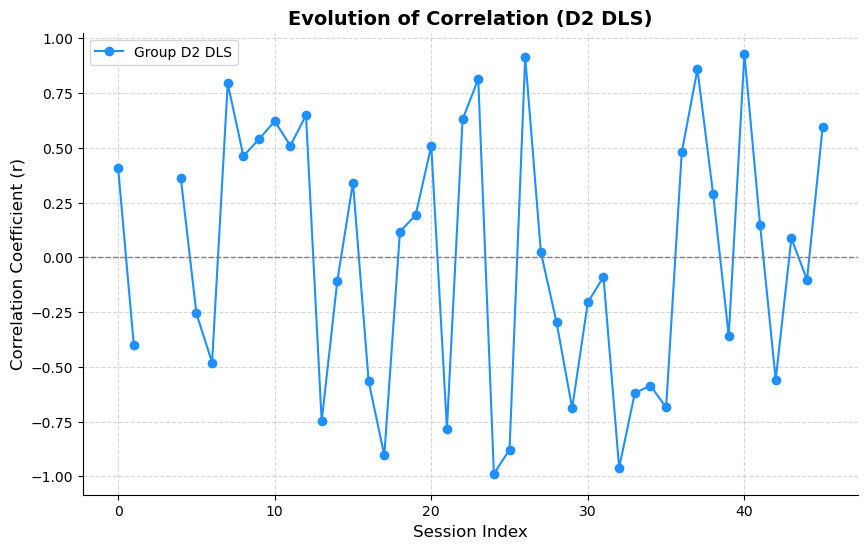

In [ ]:
def plot_correlation_evolution(ax, angular_speed_dict, success_dict, groups, session_list, group_type="D1"):
    """
    Trace l'évolution du coefficient de corrélation entre la médiane des vitesses angulaires et le pourcentage de succès
    pour toutes les sessions disponibles pour un groupe donné.

    Parameters:
    - ax: L'axe sur lequel le graphique sera tracé.
    - angular_speed_dict: Dictionnaire des vitesses angulaires médianes pour chaque session.
    - success_dict: Dictionnaire des pourcentages de succès pour chaque session.
    - groups: Dictionnaire des groupes de souris.
    - session_list: Dictionnaire contenant toutes les sessions disponibles pour chaque souris.
    - group_type: Le type de groupe à analyser.
    """
    # Préparer les données
    mice = groups[group_type]
    
    # Déterminer toutes les sessions disponibles en agrégeant celles des souris du groupe
    all_sessions = sorted({session for mouse in mice for session in range(len(session_list[mouse]))})
    correlation_coefficients = []
    
    for session_index in all_sessions:
        angular_speeds = []
        success_percentages = []

        # Collecter les données pour chaque souris dans le groupe
        for mouse in mice:
            angular_speed = angular_speed_dict[mouse].get(session_index)
            success_percentage = success_dict[mouse].get(session_index)

            if angular_speed is not None and success_percentage is not None:
                angular_speeds.append(angular_speed)
                success_percentages.append(success_percentage)
        
        # Calculer le coefficient de corrélation s'il y a suffisamment de données
        if len(angular_speeds) > 1 and len(success_percentages) > 1:
            correlation_coefficient = np.corrcoef(angular_speeds, success_percentages)[0, 1]
        else:
            correlation_coefficient = None  # Pas assez de données

        correlation_coefficients.append(correlation_coefficient)

    # Tracer l'évolution du coefficient de corrélation
    ax.plot(all_sessions, correlation_coefficients, marker='o', color='dodgerblue', label=f"Group {group_type}")
    
    # Marquer les points où la corrélation est non définie (e.g., pas de données)
    undefined_sessions = [session for session, corr in zip(all_sessions, correlation_coefficients) if corr is None]
    if undefined_sessions:
        ax.scatter(undefined_sessions, [0] * len(undefined_sessions), color='red', label="No data", alpha=0.7)
    
    # Ajouter des titres et labels
    ax.set_title(f"Evolution of Correlation ({group_type})", fontsize=14, fontweight="bold")
    ax.set_xlabel("Session Index", fontsize=12)
    ax.set_ylabel("Correlation Coefficient (r)", fontsize=12)
    ax.axhline(0, color='gray', linestyle="--", linewidth=1)  # Ligne de référence
    ax.legend(fontsize=10)
    
    # Améliorer l'apparence
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

fig, ax = plt.subplots(figsize=(10, 6))

plot_correlation_evolution(
    ax,
    median_angular_speed_BT,
    success_percentage_dict,
    groups,
    session_list,
    group_type="D2 DLS"  # Remplacez par "D2" pour analyser l'autre groupe
)

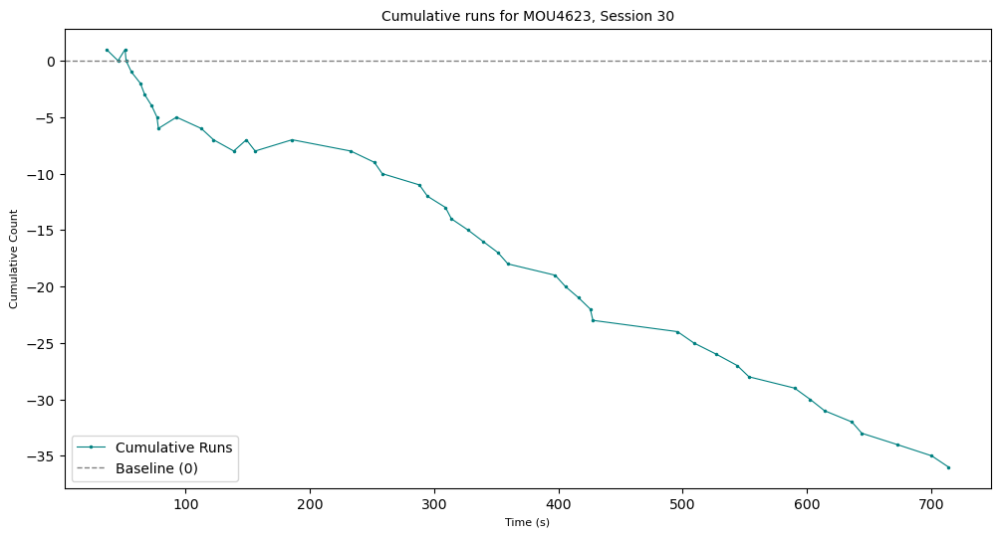

In [ ]:
def plot_runs_count(ax, mouse, session_index, y_limit=None, show_title=True):
    """
    Plots the cumulative number of rewarded and unrewarded runs around the tower
    for a specific mouse and session.

    Parameters:
    - mouse (str): The ID of the mouse.
    - session_index (int): The index of the session.
    - y_limit (int, optional): The limit for the Y-axis.
    """
    # Vérification que les données nécessaires sont disponibles
    if mouse not in runs_around_tower_dict:
        print(f"Erreur : données non disponibles pour la souris {mouse}.")
        return
    if session_index not in runs_around_tower_dict[mouse]:
        print(f"Erreur : données non disponibles pour la session {session_index} de la souris {mouse}.")
        return
    
    # Récupération des données
    runs = runs_around_tower_dict[mouse][session_index]
    
    # Initialisation des valeurs cumulatives et des temps
    cumulative_count = 0
    cumulative_values = []
    times = []
    
    # Calcul des valeurs cumulatives
    for run in runs:
        epoch_time = run[4]["epoch_time"]
        is_rewarded = run[3]["Rewarded"]
        
        # Mise à jour du compteur cumulatif
        cumulative_count += 1 if is_rewarded else -1
        
        # Stockage des valeurs pour le plot
        cumulative_values.append(cumulative_count)
        times.append(epoch_time)
    
    # Création du graphique
    ax.plot(times, cumulative_values, marker='o', linestyle='-', color='teal', label='Cumulative Runs', markersize=1.5, linewidth=0.8)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1, label='Baseline (0)')
    
    # Configuration des axes
    ax.set_xlabel("Time (s)", fontsize=8)
    ax.set_ylabel("Cumulative Count", fontsize=8)
    if show_title:
        ax.set_title(f"Cumulative runs for {mouse}, Session {session_index}", fontsize=10)
    if y_limit is not None:
        ax.set_ylim(y_limit)
    ax.legend()


# Exemple d'utilisation
fig, ax = plt.subplots(figsize=(12,6))
plot_runs_count(ax, "MOU4623", 30, y_limit=None)



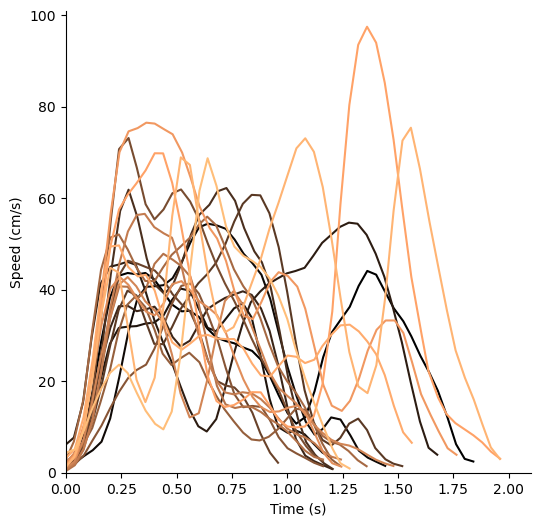

In [ ]:
def plot_speed_over_time(ax, mouse, session_index, traject_time_dict, speeds_dict, run_dict, xlim=5.1, ylim=101, set_title=False, title_type = 'run not defined'):
    """
    Trace la vitesse de la souris en fonction du temps pour le type de run spécifié.
    
    Paramètres :
        ax : Axe matplotlib sur lequel dessiner le graphique.
        traject_time (list) : Temps de la trajectoire.
        speeds (list) : Vitesse de la souris.
        runs (list) : Liste des runs pour le type spécifié.
        run_type (str) : Type de run ('between_towers', 'exploratory', 'around_tower').
        color_map (Colormap) : Colormap pour le gradient de couleur.
    """

    if mouse not in runs_around_tower_dict:
        print(f"Erreur : données non disponibles pour la souris {mouse}.")
        return
    if session_index not in runs_around_tower_dict[mouse]:
        print(f"Erreur : données non disponibles pour la session {session_index} de la souris {mouse}.")
        return
    
    runs = run_dict[mouse].get(session_index)
    if runs is None:
        print(f"Avertissement : Aucune donnée pour les runs dans la session {session_index} de la souris {mouse}.")
        return  # Si aucune donnée n'est disponible, on retourne sans effectuer d'actions


    norm = Normalize(vmin=0, vmax=len(runs))
    color_map = plt.cm.copper
    
    for index, run in enumerate(runs):
        start_index, end_index = run[0][0], run[0][1]
        adjusted_time = [t - traject_time_dict[mouse][session_index][start_index] for t in traject_time_dict[mouse][session_index][start_index:end_index + 1]]
        
        # Tracé de la vitesse
        ax.plot(adjusted_time, speeds_dict[mouse][session_index][start_index:end_index + 1], color=color_map(norm(index)))

    ax.set_ylabel('Speed (cm/s)', fontsize=10)
    ax.set_xlabel('Time (s)', fontsize=10)
    ax.set_ylim(0, ylim)
    ax.set_xlim(0, xlim)
    
    if set_title:
        ax.set_title(f"Speed profile for {title_type}", pad=5, fontsize=15)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

fig, ax = plt.subplots(figsize=(6, 6))

plot_speed_over_time(ax, "MOU4623", 26, traject_time_dict, speeds_dict, runs_between_towers_dict, title_type='CCW runs around tower', xlim=2.1)


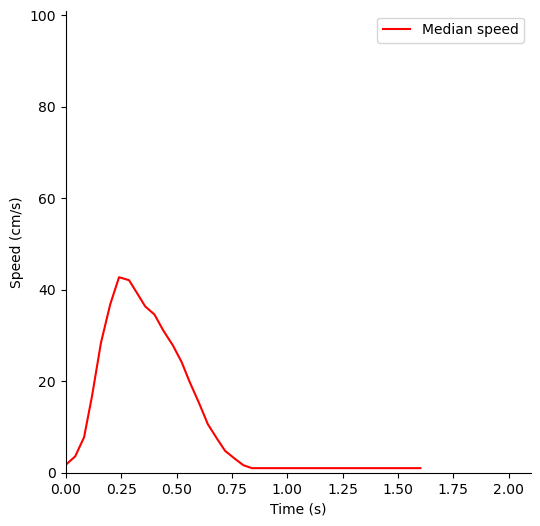

In [ ]:
def plot_median_speed_over_time(ax, mouse, session_index, traject_time_dict, speeds_dict, run_dict, 
                                xlim=5.1, ylim=101, set_title=False, title_type='run not defined', show_legend=True):
    """
    Trace la vitesse médiane de tous les runs pour un type donné, tout en respectant les durées des runs,
    sans interpolation.
    
    Paramètres :
        ax : Axe matplotlib sur lequel dessiner le graphique.
        traject_time_dict (dict) : Dictionnaire contenant le temps de trajectoire.
        speeds_dict (dict) : Dictionnaire contenant les vitesses de la souris.
        run_dict (dict) : Dictionnaire des runs pour le type spécifié.
        xlim (float) : Limite en x pour le graphique.
        ylim (float) : Limite en y pour le graphique.
        set_title (bool) : Indique si un titre doit être ajouté.
        title_type (str) : Type de run (utilisé dans le titre).
    """
    if mouse not in run_dict:
        print(f"Erreur : données non disponibles pour la souris {mouse}.")
        return
    if session_index not in run_dict[mouse]:
        print(f"Erreur : données non disponibles pour la session {session_index} de la souris {mouse}.")
        return
    
    runs = run_dict[mouse][session_index]

    if not runs:
        print(f"Aucun run disponible pour la session {session_index} de la souris {mouse}")
        return

    # Liste pour stocker les vitesses de chaque run
    all_speeds = []

    # Collecte des vitesses pour chaque run sans interpolation
    max_len = 0 # added
    for run in runs:


        start_index, end_index = run[0][0], run[0][1]
        run_speeds = speeds_dict[mouse][session_index][start_index:end_index + 1]
        all_speeds.append(run_speeds)

        if len(run_speeds) >= max_len:
            max_len = len(run_speeds)
            adjusted_time = [t - traject_time_dict[mouse][session_index][start_index] 
                             for t in traject_time_dict[mouse][session_index][start_index:end_index + 1]]
                
    ######################################
     
    new_all_speeds = []

    for v in all_speeds:
        nans_to_add = np.ones(max_len - len(v))
        v_new = np.concatenate((v, nans_to_add))
        new_all_speeds.append(v_new)
        
    new_all_speeds = np.array(new_all_speeds)
    median_speeds = np.nanmedian(new_all_speeds, axis=0)
    
    # Calcul de la médiane point par point
    # max_len = max(len(run_speeds) for run_speeds in all_speeds)
    
    # # Initialiser un tableau pour stocker les vitesses de chaque "instant" pour tous les runs
    # median_speeds = np.full((max_len,), np.nan)
    
    # # Calcul de la médiane à chaque "instant" (point temporel) parmi tous les runs
    # for t in range(max_len):
    #     # Collecte des vitesses pour le point temporel t
    #     speeds_at_t = [run_speeds[t] for run_speeds in all_speeds if t < len(run_speeds)]
        
    #     if speeds_at_t:  # Si il y a des vitesses à ce point temporel
    #         median_speeds[t] = np.nanmedian(speeds_at_t) # add nanmedian to ignore nan values
    
    # Tracer la courbe médiane
    ax.plot(adjusted_time, median_speeds, color='red', label='Median speed')
    ax.set_ylabel('Speed (cm/s)', fontsize=10)
    ax.set_xlabel('Time (s)', fontsize=10)
    ax.set_ylim(0, ylim)
    ax.set_xlim(0, xlim)
    
    if set_title:
        ax.set_title(f"Median speed profile for {title_type}", pad=10, fontsize=17)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if show_legend:
        ax.legend()

fig, ax = plt.subplots(figsize=(6, 6))
plot_median_speed_over_time(ax, "MOU4623", 26, traject_time_dict, speeds_dict, rewarded_QT_dict, 
                            title_type='Rewarded runs around tower', xlim=2.1)
plt.show()


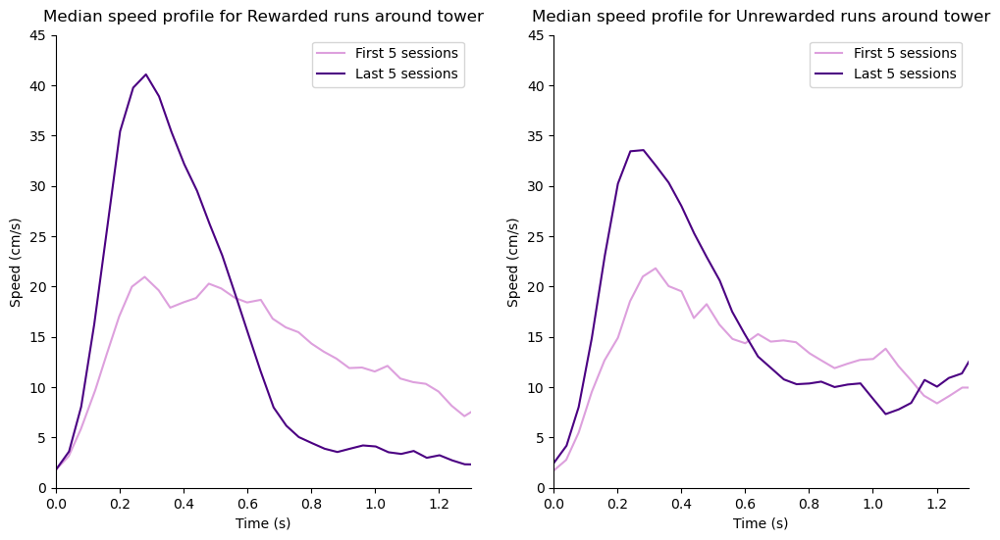

In [ ]:
def plot_median_speed_over_5_sessions(ax, mouse, session_groups, traject_time_dict, speeds_dict, run_dict, 
                                    xlim=5.1, ylim=101, set_title=False, title_type='run not defined', show_legend=True):
    """
    Trace la vitesse médiane pour des groupes de sessions, tout en respectant les durées des runs, sans interpolation.
    
    Paramètres :
        ax : Axe matplotlib sur lequel dessiner le graphique.
        mouse (str) : Nom de la souris.
        session_groups (list) : Liste de listes, chaque sous-liste contient des indices de sessions à combiner.
        traject_time_dict (dict) : Dictionnaire contenant le temps de trajectoire.
        speeds_dict (dict) : Dictionnaire contenant les vitesses de la souris.
        run_dict (dict) : Dictionnaire des runs pour le type spécifié.
        xlim (float) : Limite en x pour le graphique.
        ylim (float) : Limite en y pour le graphique.
        set_title (bool) : Indique si un titre doit être ajouté.
        title_type (str) : Type de run (utilisé dans le titre).
        show_legend (bool) : Indique si une légende doit être affichée.
    """
    colors = ['plum', 'indigo']  # Couleurs pour différencier les groupes
    labels = ['First 5 sessions', 'Last 5 sessions']
    
    for idx, session_group in enumerate(session_groups):
        all_speeds = []
        max_len = 0

        for session_index in session_group:
            if mouse not in run_dict or session_index not in run_dict[mouse]:
                print(f"Données non disponibles pour la session {session_index} de la souris {mouse}.")
                continue
            
            runs = run_dict[mouse][session_index]

            for run in runs:
                start_index, end_index = run[0][0], run[0][1]
                run_speeds = speeds_dict[mouse][session_index][start_index:end_index + 1]
                all_speeds.append(run_speeds)

                if len(run_speeds) > max_len:
                    max_len = len(run_speeds)
                    adjusted_time = [
                        t - traject_time_dict[mouse][session_index][start_index] 
                        for t in traject_time_dict[mouse][session_index][start_index:end_index + 1]
                    ]

        # Ajuster les longueurs des runs et calculer les médianes
        new_all_speeds = []
        for v in all_speeds:
            nans_to_add = np.ones(max_len - len(v)) * np.nan
            v_new = np.concatenate((v, nans_to_add))
            new_all_speeds.append(v_new)
        
        new_all_speeds = np.array(new_all_speeds)
        median_speeds = np.nanmedian(new_all_speeds, axis=0)
        
        # Tracer la courbe médiane pour le groupe
        ax.plot(adjusted_time, median_speeds, color=colors[idx], label=labels[idx])

    # Configuration des axes et titre
    ax.set_ylabel('Speed (cm/s)', fontsize=10)
    ax.set_xlabel('Time (s)', fontsize=10)
    ax.set_ylim(0, ylim)
    ax.set_xlim(0, xlim)
    
    if set_title:
        ax.set_title(f"Median speed profile for {title_type}", pad=10, fontsize=12)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if show_legend:
        ax.legend()

# Exécution du code pour afficher les 5 premières et dernières sessions
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

first_5_sessions = [1, 2, 3, 4,5]  # Indices des 5 premières sessions
last_5_sessions = [25, 26, 27, 30, 31]   # Indices des 5 dernières sessions

plot_median_speed_over_5_sessions(axs[0], "MOU4623", 
                                [first_5_sessions, last_5_sessions], 
                                traject_time_dict, speeds_dict, rewarded_QT_dict, 
                                xlim=1.3, ylim=45, set_title = True, title_type='Rewarded runs around tower')

plot_median_speed_over_5_sessions(axs[1], "MOU4623", 
                                [first_5_sessions, last_5_sessions], 
                                traject_time_dict, speeds_dict, unrewarded_QT_dict, 
                                xlim=1.3, ylim=45, set_title = True, title_type='Unrewarded runs around tower')

plt.show()



In [ ]:
def generate_pdf_figures(mouse, traject_time_dict, speeds_dict, 
                         rewarded_QT_dict, unrewarded_QT_dict, 
                         runs_between_towers_dict, output_path):
    """
    Génère un PDF contenant des figures avec deux colonnes, une pour chaque paire de sessions adjacentes.

    Important: check how nanmedian works to be sure its the good function
    
    Arguments :
        mouse (str) : Identifiant de la souris.
        traject_time_dict (dict) : Dictionnaire contenant les temps de trajectoire.
        speeds_dict (dict) : Dictionnaire contenant les vitesses de la souris.
        rewarded_QT_dict (dict) : Dictionnaire des runs récompensés.
        unrewarded_QT_dict (dict) : Dictionnaire des runs non récompensés.
        runs_between_towers_dict (dict) : Dictionnaire des runs entre les tours.
        output_path (str) : Chemin du fichier PDF de sortie.
    """

    # Obtenez la liste des sessions pour la souris
    if mouse not in session_list:
        raise KeyError(f"La souris '{mouse}' n'existe pas dans la liste des sessions.")
    sessions = session_list[mouse]  # Récupérer les sessions de la souris
    num_sessions = len(sessions)

    # Créez un objet PdfPages
    with PdfPages(output_path) as pdf:
        # Parcourez les indices pairs des sessions
        for i in range(0, num_sessions, 2):
            fig = plt.figure(figsize=(18, 8))
            gs = GridSpec(4, 4, figure=fig, hspace=0.5, wspace=0.4)
            title_left = f"Session {i}" if i < num_sessions else "N/A"
            title_right = f"Session {i+1}" if i + 1 < num_sessions else "N/A"
            fig.suptitle(f"Mouse: {mouse} | {title_left} and {title_right}", 
                         fontsize=16, y=0.95, fontweight='bold', fontname='Nimbus Sans Narrow')
            
            # Colonne de gauche : session index pair
            if i < num_sessions:
                ax_count_left = fig.add_subplot(gs[0, 0:2])
                ax_speed_rew_left = fig.add_subplot(gs[1, 0])
                ax_speed_unrew_left = fig.add_subplot(gs[2, 0])
                ax_speed_BT_left = fig.add_subplot(gs[3, 0])
                ax_med_rew_left  = fig.add_subplot(gs[1, 1])
                ax_med_unrew_left = fig.add_subplot(gs[2, 1])
                ax_med_BT_left = fig.add_subplot(gs[3, 1])
                
                plot_runs_count(ax_count_left, mouse, i, y_limit=None, show_title=False)

                plot_speed_over_time(ax_speed_rew_left, mouse, i, traject_time_dict, speeds_dict, rewarded_QT_dict, 
                                     title_type='Rewarded runs around tower', xlim=2.1)
                plot_speed_over_time(ax_speed_unrew_left, mouse, i, traject_time_dict, speeds_dict, unrewarded_QT_dict, 
                                     title_type='Unrewarded runs around tower', xlim=2.1)
                plot_speed_over_time(ax_speed_BT_left, mouse, i, traject_time_dict, speeds_dict, runs_between_towers_dict, 
                                     title_type='Runs between tower', xlim=2.1)
                
                plot_median_speed_over_time(ax_med_rew_left, mouse, i, traject_time_dict, speeds_dict, rewarded_QT_dict, 
                                            title_type='Rewarded runs around tower', xlim=2.1)
                plot_median_speed_over_time(ax_med_unrew_left, mouse, i, traject_time_dict, speeds_dict, unrewarded_QT_dict, 
                                            title_type='Unrewarded runs around tower', xlim=2.1, show_legend=False)
                plot_median_speed_over_time(ax_med_BT_left, mouse, i, traject_time_dict, speeds_dict, runs_between_towers_dict, 
                                            title_type='Runs between towers', xlim=2.1, show_legend=False)
            
            # Colonne de droite : session index impair
            if i + 1 < num_sessions:
                ax_count_right = fig.add_subplot(gs[0, 2:4])
                ax_speed_rew_right = fig.add_subplot(gs[1, 2])
                ax_speed_unrew_right = fig.add_subplot(gs[2, 2])
                ax_speed_BT_right = fig.add_subplot(gs[3, 2])
                ax_med_rew_right  = fig.add_subplot(gs[1, 3])
                ax_med_unrew_right = fig.add_subplot(gs[2, 3])
                ax_med_BT_right = fig.add_subplot(gs[3, 3])
                
                plot_runs_count(ax_count_right, mouse, i + 1, y_limit=None, show_title=False)

                plot_speed_over_time(ax_speed_rew_right, mouse, i + 1, traject_time_dict, speeds_dict, rewarded_QT_dict, 
                                     title_type='Rewarded runs around tower', xlim=2.1)
                plot_speed_over_time(ax_speed_unrew_right, mouse, i + 1, traject_time_dict, speeds_dict, unrewarded_QT_dict, 
                                     title_type='Unrewarded runs around tower', xlim=2.1)
                plot_speed_over_time(ax_speed_BT_right, mouse, i + 1, traject_time_dict, speeds_dict, runs_between_towers_dict, 
                                     title_type='Runs between tower', xlim=2.1)
                
                plot_median_speed_over_time(ax_med_rew_right, mouse, i+1, traject_time_dict, speeds_dict, rewarded_QT_dict, 
                                            title_type='Rewarded runs around tower', xlim=2.1)
                plot_median_speed_over_time(ax_med_unrew_right, mouse, i+1, traject_time_dict, speeds_dict, unrewarded_QT_dict, 
                                            title_type='Unrewarded runs around tower', xlim=2.1, show_legend=False)
                plot_median_speed_over_time(ax_med_BT_right, mouse, i+1, traject_time_dict, speeds_dict, runs_between_towers_dict, 
                                            title_type='Runs between towers', xlim=2.1, show_legend=False)
            
            # Ajoutez la figure au PDF
            pdf.savefig(fig)
            plt.close(fig)

output_path = f'/home/david/Pictures/PDF_figure/{mouse}_figure.pdf'
# generate_pdf_figures('MOU4623', traject_time_dict, speeds_dict, 
#                          rewarded_QT_dict, unrewarded_QT_dict, 
#                          runs_between_towers_dict, output_path)

### Mesure du biais directionnel en début de session et modulation de vitesse:

Objectif du biais directionnel en début de session : Pour déterminer si le biais est plus marqué en début de session et modulé par la présence de CNO, tu peux examiner les quarts de tours réalisés dans la direction préférée (le sens du biais) versus la direction imposée. 

Indice de biais directionnel : Calcule un indice de biais en prenant la proportion de quarts de tours dans la direction du biais par rapport au total des quarts de tours au cours des premières minutes (par exemple, 5 premières minutes).

### Comparaison entre sessions "opposées" et "alignées" : 

Quantifie le pourcentage de quarts de tours réussis dans les sessions où la direction de récompense est opposée au biais naturel induit par le CNO versus celles où elle est alignée. Cela permettrait de montrer quantitativement le désavantage induit par le biais dans certaines sessions par rapport aux autres.

## 2. Analyse des changements de vitesse et de trajectoire
### Analyse des trajectoires autour des tours : 

Plotte les trajectoires pour voir si les animaux injectés ont tendance à réaliser un arc de cercle plus large ou plus étroit autour des tours en fonction du sens imposé.

Trace les trajectoires autour des tours pour chaque session. Ensuite, quantifie le rayon moyen de l’arc de cercle autour des tours en mesurant la distance entre la souris et le centre de chaque tour pendant qu’elle tourne.

Paramètres d’analyse :
- Rayon moyen autour des tours : Compare la distance moyenne au centre des tours pour chaque condition expérimentale.
- Analyse des écarts à l’arc de cercle : Une variance plus élevée du rayon pourrait montrer une difficulté à maintenir une trajectoire stable.

## 3. Analyse de l'apprentissage et de la plasticité entre les sessions
### Performance "cross-session" : 

Évalue le taux de réussite de chaque session matinale par rapport à l'après-midi suivant. Une analyse de régression sur la performance entre sessions pourrait montrer si les animaux sous CNO dans une condition contraignante (opposée au biais) "apprennent" mieux, en augmentant leur performance l’après-midi, comparé aux autres conditions.

## 4. Influence de l’historique des rewards sur le comportement futur
### Influence du nombre de récompenses reçues sur la persévérance autour des tours :
Analyse la relation entre le nombre de récompenses atteintes à la tour précédente et le nombre de quarts de tours effectués dans la tour actuelle. En particulier, mesure si un nombre élevé de récompenses dans la tour précédente amène les souris à rester plus longtemps à la tour suivante ou à la quitter plus vite une fois la récompense atteinte.

### Influence du nombre de récompenses sur la vitesse des quarts de tours

Enregistre la vitesse des quarts de tours après avoir atteint le maximum de récompenses dans un tour précédent, puis compare cette vitesse lorsque les récompenses précédentes étaient faibles versus élevées.

### Analyse des trajectoires entre les tours en fonction des récompenses précédentes

Examine les trajectoires des souris entre deux tours et analyse si ces trajectoires deviennent plus directes après être allées dans une tour hautement récompensée, ou si elles restent plus exploratoires.

### Analyse de la persistance directionnelle en fonction des récompenses obtenues

Quantifie si les animaux tendent à conserver la même direction de quart de tour d’une tour à l’autre après avoir reçu un nombre élevé de récompenses (ou en fonction du nombre de récompenses obtenues). Une telle persistance pourrait indiquer que les récompenses renforcent non seulement l’emplacement mais aussi la direction du mouvement.